In [3]:
!pip install opencv-python-headless matplotlib numpy ipywidgets


[notice] A new release of pip is available: 24.0 -> 26.2.1
[notice] To update, run: pip install --upgrade pip


In [139]:
from IPython.display import display
import ipywidgets as widgets

uploader = widgets.FileUpload(
    accept='image/*',
    multiple=False
)

display(uploader)



FileUpload(value=(), accept='image/*', description='Upload')

In [310]:
# Get uploaded image
uploaded = uploader.value

if uploaded:
    # ipywidgets versions differ slightly
    if isinstance(uploaded, dict):
        file_info = next(iter(uploaded.values()))
    else:
        file_info = uploaded[0]

    image_bytes = file_info['content']

    print("Loaded:", file_info['name'])

Loaded: WhatsApp Image 2026-08-18 at 15.23.42.jpeg


Width: 1600
Height: 1301


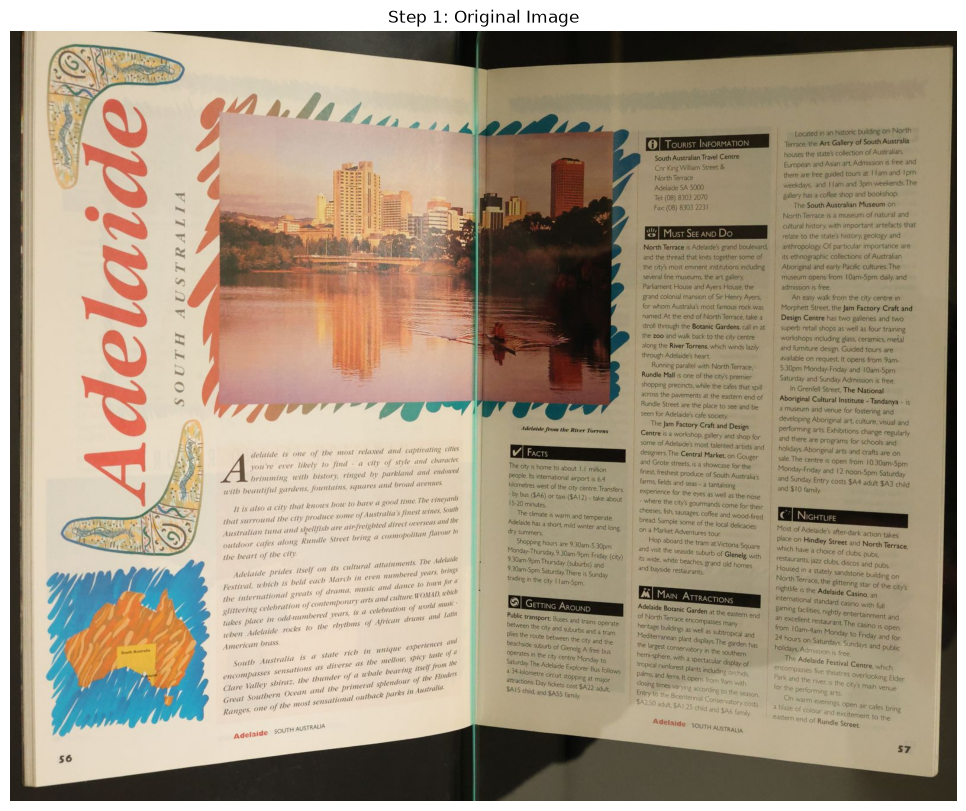

In [311]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imdecode(
    np.frombuffer(image_bytes, np.uint8),
    cv2.IMREAD_COLOR
)

if img is None:
    raise ValueError("Could not load image")

original = img.copy()

h, w = img.shape[:2]

print("Width:", w)
print("Height:", h)

plt.figure(figsize=(16, 10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Step 1: Original Image")
plt.axis("off")
plt.show()


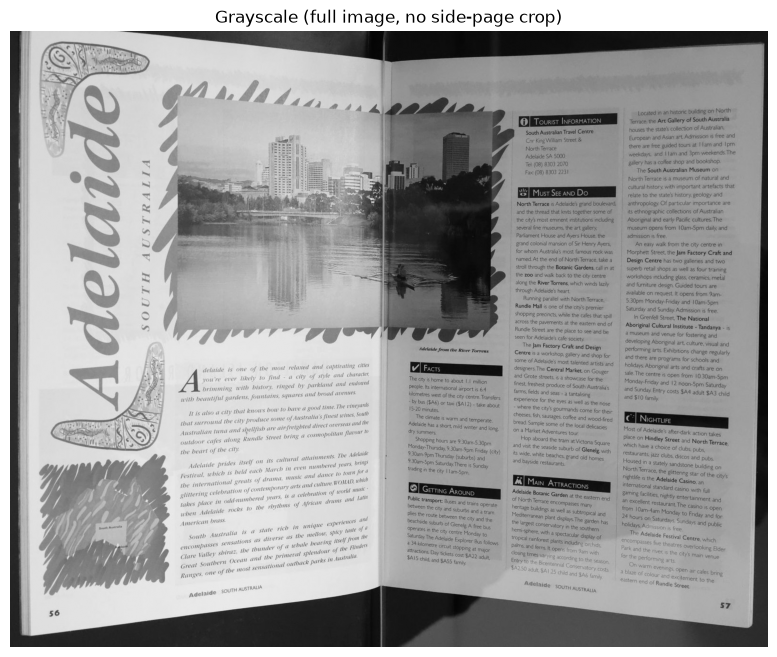

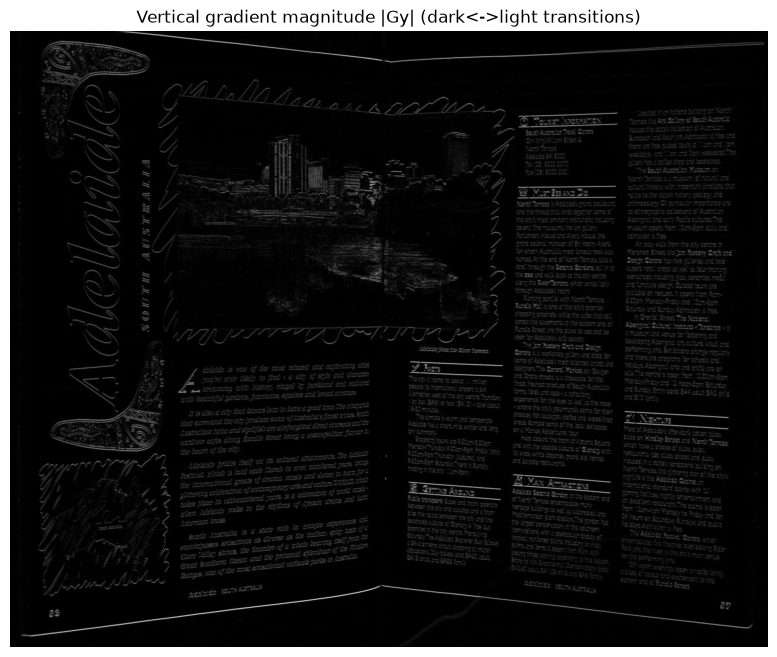

In [312]:
# Cell 4A (patched): Grayscale + vertical gradient of the FULL image.
# YCrCb valley detection / side-page cropping removed for this experiment --
# no more front_pages crop, so we work directly on img. left_cut/right_cut/
# gutter_x_global are still needed by later cells as anchors; without the
# Cb-valley measurement they fall back to the image bounds / center.

gray_fp = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gy_fp = cv2.Sobel(gray_fp, cv2.CV_32F, 0, 1, ksize=3)

Hf, Wf = gray_fp.shape

front_pages = img  # alias: no side-page crop anymore, downstream code unchanged
left_cut = 0
right_cut = Wf - 1  # anchor must be a valid column index, not the exclusive width
gutter_x_global = Wf // 2  # crude center seed -- no Cb-valley gutter estimate to anchor to

def find_sustained_transition_row(gray_col, window=80, high_thresh_frac=0.6, from_top=True):
    """General page<->background edge-region finder -- NOT tied to any
    fixed fraction of image height (a hardcoded fraction like Hf*0.35 or
    Hf*0.65 only works on the one photo it was tuned against; confirmed
    broken on a second test photo where the true edges sat at different
    fractions). Works from the column's OWN brightness levels: page level
    is the median of the middle 60% of the column, background level is
    the darkest of the crop's own top/bottom 20px. A short text-line dip
    bounces back within `window` px so the ROLLING MEAN stays above
    threshold; only a REAL edge has brightness drop and stay low for a
    sustained run."""
    n = len(gray_col)
    mid_lo, mid_hi = int(n*0.2), int(n*0.8)
    page_level = np.median(gray_col[mid_lo:mid_hi])
    bg_level = min(gray_col[:20].min(), gray_col[-20:].min())
    threshold = bg_level + (page_level - bg_level) * high_thresh_frac

    kernel = np.ones(window) / window
    rolling = np.convolve(gray_col.astype(np.float64), kernel, mode='same')
    above = rolling > threshold
    idx = np.where(above)[0]
    if len(idx) == 0:
        return 0 if from_top else n - 1
    return idx.min() if from_top else idx.max()

plt.figure(figsize=(14, 8))
plt.imshow(gray_fp, cmap='gray')
plt.title("Grayscale (full image, no side-page crop)")
plt.axis("off")
plt.show()

plt.figure(figsize=(14, 8))
plt.imshow(np.abs(gy_fp), cmap='gray')
plt.title("Vertical gradient magnitude |Gy| (dark<->light transitions)")
plt.axis("off")
plt.show()


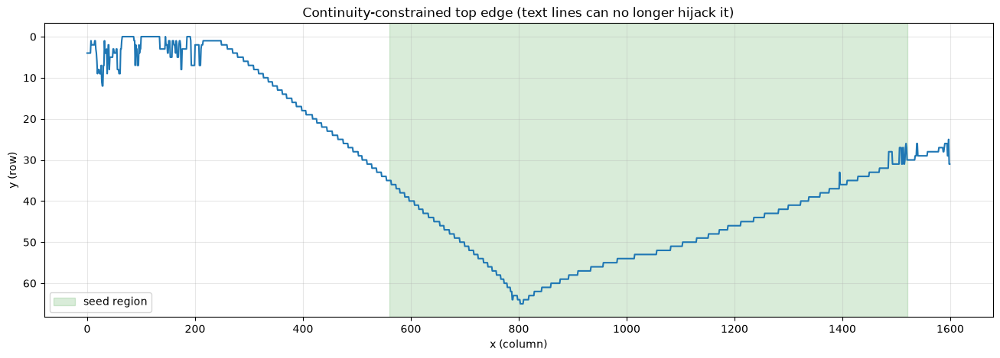

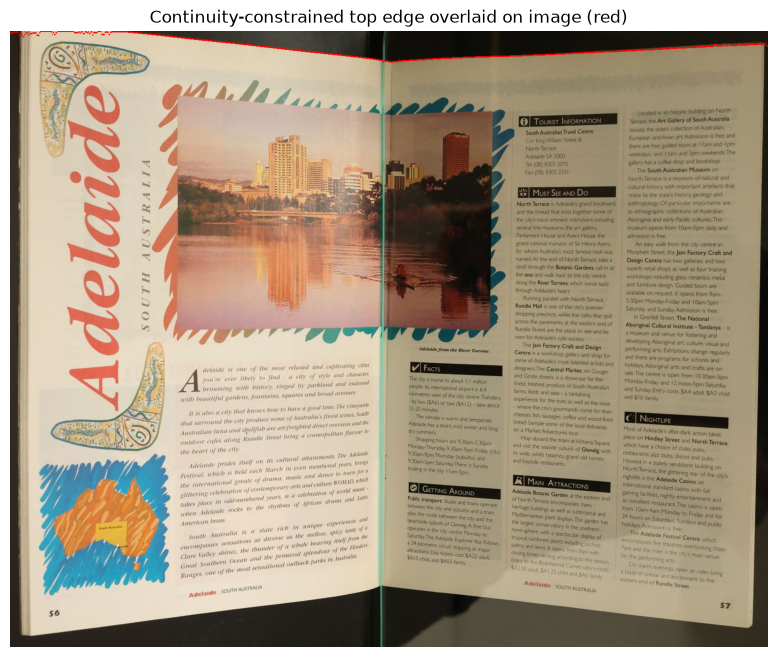

In [313]:
# Cell 4B: Continuity-constrained top-edge trace.
#
# The naive "strongest Gy in the top third" trace (see prior attempt) falls
# into text-line edges across most of the width, not just at the fingers --
# printed text lines are high-contrast dark<->light transitions too, so a
# free per-column argmax has no reason to prefer the true page edge over a
# line of body text lower down. Fingers were never the only problem.
#
# Fix: seed from a column range known to sit on the flat, reliable part of
# the edge (visually confirmed in the previous cell's plot: a stable run
# around x=850-2300). From that seed, walk outward one column at a time,
# each column only allowed to search a small window around the PREVIOUS
# column's accepted row. A text line deep in the page is now unreachable in
# a single column-step, so it can never hijack the trace; a finger sitting
# on the edge shifts the trace smoothly by a few px per column (bridged),
# not a text-line's full-height jump.

seed_lo, seed_hi = int(Wf * 0.35), int(Wf * 0.95)  # inside the flat run
seed_col = (seed_lo + seed_hi) // 2

# search_top: derived from THIS column's own brightness (not a hardcoded
# fraction of Hf -- confirmed broken on a 2nd test photo where the real
# edge sat well outside the old 0.35*Hf assumption). Give it margin beyond
# the detected edge so the seed's own local search window has room.
edge_row_estimate = find_sustained_transition_row(gray_fp[:, seed_col], from_top=True)
search_top = min(Hf, edge_row_estimate + 150)
max_step = 6          # max row change allowed per column step

seed_lo_search = max(0, edge_row_estimate - 100)
seed_row = seed_lo_search + int(np.argmax(gy_fp[seed_lo_search:search_top, seed_col]))

top_edge = np.zeros(Wf, dtype=np.int32)
top_edge[seed_col] = seed_row

# walk right
prev = seed_row
for x in range(seed_col + 1, Wf):
    lo = max(0, prev - max_step)
    hi = min(search_top, prev + max_step + 1)
    window = gy_fp[lo:hi, x]
    prev = lo + int(np.argmax(window))
    top_edge[x] = prev

# walk left
prev = seed_row
for x in range(seed_col - 1, -1, -1):
    lo = max(0, prev - max_step)
    hi = min(search_top, prev + max_step + 1)
    window = gy_fp[lo:hi, x]
    prev = lo + int(np.argmax(window))
    top_edge[x] = prev

plt.figure(figsize=(16, 5))
plt.plot(top_edge)
plt.gca().invert_yaxis()
plt.axvspan(seed_lo, seed_hi, alpha=0.15, color='green', label='seed region')
plt.title("Continuity-constrained top edge (text lines can no longer hijack it)")
plt.xlabel("x (column)")
plt.ylabel("y (row)")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

vis = cv2.cvtColor(front_pages, cv2.COLOR_BGR2RGB).copy()
for x in range(Wf):
    vis[max(0, top_edge[x]-1):top_edge[x]+2, x] = [255, 0, 0]

plt.figure(figsize=(14, 8))
plt.imshow(vis)
plt.title("Continuity-constrained top edge overlaid on image (red)")
plt.axis("off")
plt.show()





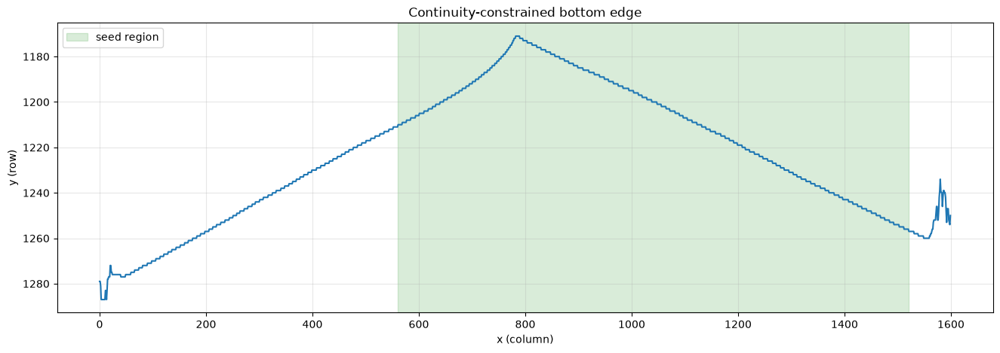

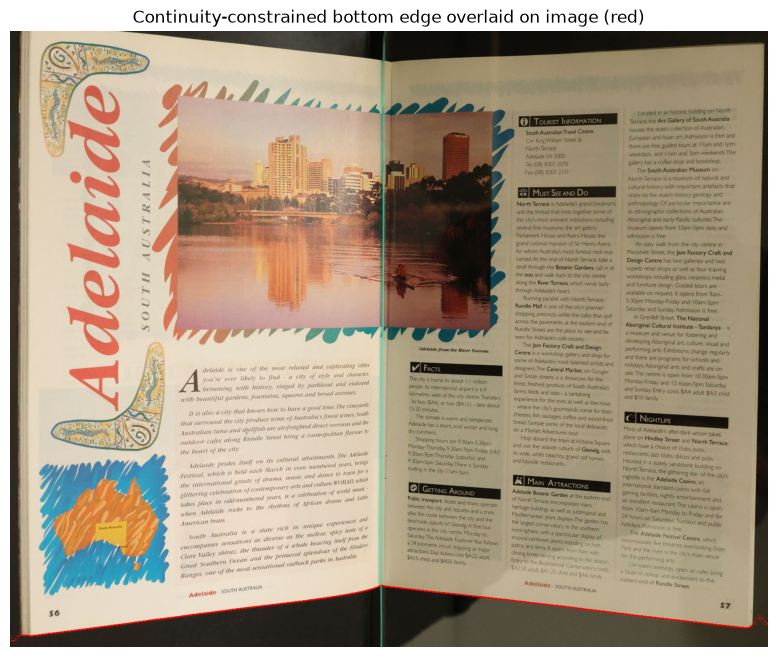

In [314]:
# Cell 4C: Continuity-constrained bottom-edge trace
#
# Mirrors the top-edge tracker:
#   - Find a reliable seed column
#   - Estimate the bottom boundary from that column
#   - Find the strongest local vertical transition
#   - Walk left/right while allowing only small vertical movement
#
# No global curve fitting.
# No hardcoded bottom shape.
# Real boundary curvature is preserved.

# ------------------------------------------------------------
# 1. Seed region
# ------------------------------------------------------------

seed_lo = int(Wf * 0.35)
seed_hi = int(Wf * 0.95)
seed_col = (seed_lo + seed_hi) // 2


# ------------------------------------------------------------
# 2. Estimate bottom boundary at seed column
# ------------------------------------------------------------

edge_row_estimate = find_sustained_transition_row(
    gray_fp[:, seed_col],
    from_top=False
)

# Search a local band around the estimate.
# For the bottom edge, search upward from the estimate as well
# as slightly below it.

search_bot = max(0, edge_row_estimate - 150)
search_bot_hi = min(Hf, edge_row_estimate + 100)


# ------------------------------------------------------------
# 3. Find strongest local vertical transition at seed
# ------------------------------------------------------------

seed_window = np.abs(
    gy_fp[search_bot:search_bot_hi, seed_col]
)

seed_row = (
    search_bot
    + int(np.argmax(seed_window))
)


# ------------------------------------------------------------
# 4. Allocate output
# ------------------------------------------------------------

bottom_edge = np.zeros(Wf, dtype=np.int32)
bottom_edge[seed_col] = seed_row

# Maximum vertical movement allowed between adjacent columns.
# Keeps text/fingers from causing large jumps.
max_step = 6


# ------------------------------------------------------------
# 5. Walk RIGHT
# ------------------------------------------------------------

prev = seed_row

for x in range(seed_col + 1, Wf):

    lo = max(0, prev - max_step)
    hi = min(Hf, prev + max_step + 1)

    window = np.abs(
        gy_fp[lo:hi, x]
    )

    # Strongest vertical transition inside the continuity window
    prev = lo + int(np.argmax(window))

    bottom_edge[x] = prev


# ------------------------------------------------------------
# 6. Walk LEFT
# ------------------------------------------------------------

prev = seed_row

for x in range(seed_col - 1, -1, -1):

    lo = max(0, prev - max_step)
    hi = min(Hf, prev + max_step + 1)

    window = np.abs(
        gy_fp[lo:hi, x]
    )

    # Strongest vertical transition inside the continuity window
    prev = lo + int(np.argmax(window))

    bottom_edge[x] = prev


# ------------------------------------------------------------
# 7. Plot detected bottom boundary
# ------------------------------------------------------------

plt.figure(figsize=(16, 5))

plt.plot(bottom_edge)

plt.gca().invert_yaxis()

plt.axvspan(
    seed_lo,
    seed_hi,
    alpha=0.15,
    color="green",
    label="seed region"
)

plt.title(
    "Continuity-constrained bottom edge"
)

plt.xlabel("x (column)")
plt.ylabel("y (row)")

plt.legend()
plt.grid(alpha=0.3)

plt.show()


# ------------------------------------------------------------
# 8. Overlay on original image
# ------------------------------------------------------------

vis = cv2.cvtColor(
    front_pages,
    cv2.COLOR_BGR2RGB
).copy()

for x in range(Wf):

    y = bottom_edge[x]

    vis[
        max(0, y - 1):min(Hf, y + 2),
        x
    ] = [255, 0, 0]


plt.figure(figsize=(14, 8))

plt.imshow(vis)

plt.title(
    "Continuity-constrained bottom edge overlaid on image (red)"
)

plt.axis("off")

plt.show()


Top edge: bridged 248 / 1600 low-confidence (finger) columns locally


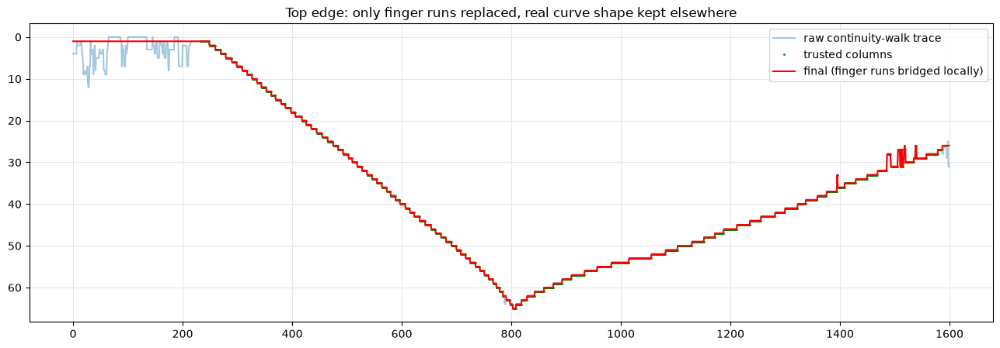

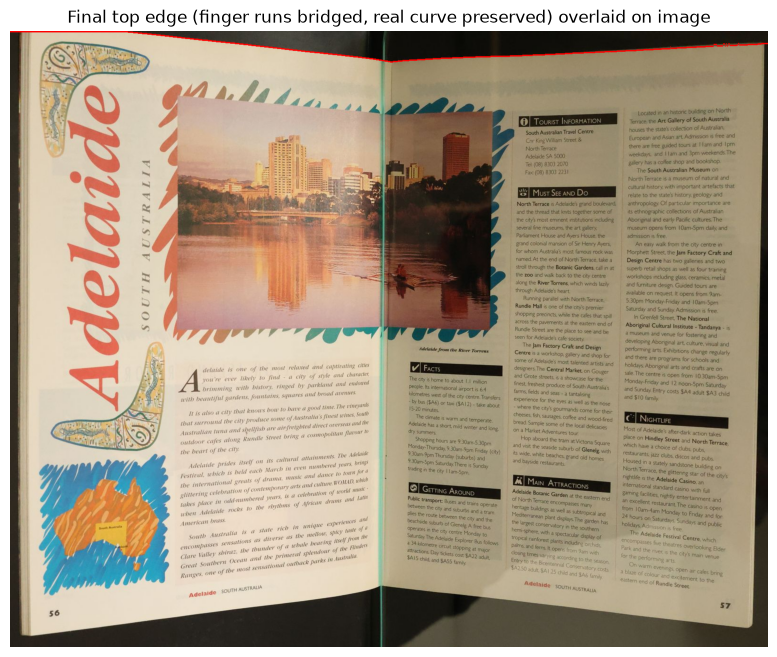

In [315]:
# Cell 4D: Reject finger-covered columns on the TOP edge, then LOCALLY
# gap-fill only across those rejected runs (not a global polynomial --
# that flattened the real gutter V-notch into a straight diagonal, which
# is wrong: the true curve shape must be preserved everywhere except where
# a finger actually breaks the signal).
#
# Score each column's confidence by how strong its accepted Gy peak is
# versus the trace's own median peak strength. A finger breaks the clean
# background->paper contrast, so finger-covered columns show up as
# anomalously weak. For each contiguous run of rejected columns, replace
# ONLY that run with a straight-line interpolation between its two
# trustworthy neighbors (last-good-before, first-good-after) -- everywhere
# else keeps the real traced curve untouched, gutter notch included.

peak_strength = np.array([gy_fp[top_edge[x], x] for x in range(Wf)])
median_strength = np.median(peak_strength)
confidence_threshold = median_strength * 0.4
good = peak_strength > confidence_threshold

top_edge_final = top_edge.copy()

# find contiguous bad runs and bridge each one individually
x = 0
while x < Wf:
    if not good[x]:
        run_start = x
        while x < Wf and not good[x]:
            x += 1
        run_end = x  # exclusive
        lo_val = top_edge[run_start - 1] if run_start > 0 else top_edge[run_end]
        hi_val = top_edge[run_end] if run_end < Wf else top_edge[run_start - 1]
        n = run_end - run_start
        top_edge_final[run_start:run_end] = np.linspace(lo_val, hi_val, n + 2)[1:-1].astype(np.int32)
    else:
        x += 1

print(f"Top edge: bridged {np.count_nonzero(~good)} / {Wf} low-confidence (finger) columns locally")

plt.figure(figsize=(16, 5))
plt.plot(top_edge, alpha=0.4, label="raw continuity-walk trace")
plt.plot(np.where(good)[0], top_edge[good], '.', markersize=2, color='green', label="trusted columns")
plt.plot(top_edge_final, color='red', linewidth=1.5, label="final (finger runs bridged locally)")
plt.gca().invert_yaxis()
plt.title("Top edge: only finger runs replaced, real curve shape kept elsewhere")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

vis = cv2.cvtColor(front_pages, cv2.COLOR_BGR2RGB).copy()
for x in range(Wf):
    ty = top_edge_final[x]
    vis[max(0,ty-1):ty+2, x] = [255, 0, 0]

plt.figure(figsize=(14, 8))
plt.imshow(vis)
plt.title("Final top edge (finger runs bridged, real curve preserved) overlaid on image")
plt.axis("off")
plt.show()


Top notch:    x=803  y=65
Bottom notch: x=782  y=1171


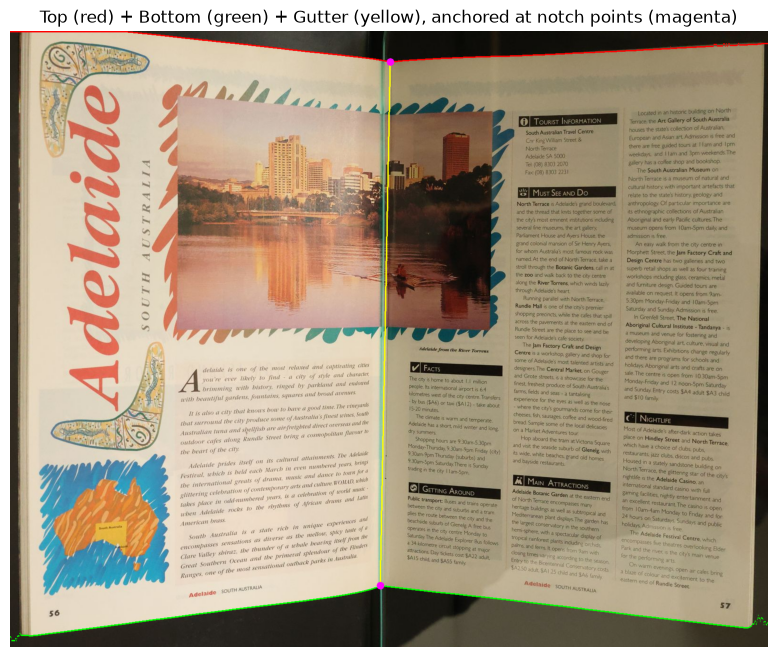

In [316]:
# Cell 5A: Gutter as two anchor points, not a per-row search.
#
# The per-row Gx search (previous attempt) wandered by ~200px chasing local
# text/shadow contrast near the spine instead of the one true crease -- the
# gutter isn't a strong continuous edge to trace at all. But top_edge_final
# and bottom_edge ALREADY show a clear V-notch right at the spine (visible
# in every overlay so far: both curves dip toward the gutter). Use that
# directly: find the notch point in each curve near the seeded gutter x,
# and connect the two points with a smooth line. No new per-row search.

gutter_x_seed = gutter_x_global - left_cut  # shift from ORIGINAL image coords into front_pages crop coords
search_half_width = 250
lo_x = max(0, gutter_x_seed - search_half_width)
hi_x = min(Wf, gutter_x_seed + search_half_width)

# top curve dips DOWN (y increases) toward the gutter -> local max of y
top_notch_x = lo_x + int(np.argmax(top_edge_final[lo_x:hi_x]))
top_notch_y = int(top_edge_final[top_notch_x])

# bottom curve dips UP (y decreases) toward the gutter -> local min of y
bot_notch_x = lo_x + int(np.argmin(bottom_edge[lo_x:hi_x]))
bot_notch_y = int(bottom_edge[bot_notch_x])

print(f"Top notch:    x={top_notch_x}  y={top_notch_y}")
print(f"Bottom notch: x={bot_notch_x}  y={bot_notch_y}")

# connect with a straight line (gutter is only slightly curved -- if this
# isn't curved enough visually, next step is a gentle quadratic bow)
n_pts = bot_notch_y - top_notch_y
gutter_ys = np.arange(top_notch_y, bot_notch_y)
gutter_xs = np.linspace(top_notch_x, bot_notch_x, n_pts).astype(np.int32)

vis = cv2.cvtColor(front_pages, cv2.COLOR_BGR2RGB).copy()
for x in range(Wf):
    ty = top_edge_final[x]
    vis[max(0,ty-1):ty+2, x] = [255, 0, 0]
    by = bottom_edge[x]
    vis[max(0,by-1):by+2, x] = [0, 255, 0]
for gy, gx in zip(gutter_ys, gutter_xs):
    vis[gy, max(0,gx-1):gx+2] = [255, 255, 0]
cv2.circle(vis, (top_notch_x, top_notch_y), 8, (255, 0, 255), -1)
cv2.circle(vis, (bot_notch_x, bot_notch_y), 8, (255, 0, 255), -1)

plt.figure(figsize=(14, 8))
plt.imshow(vis)
plt.title("Top (red) + Bottom (green) + Gutter (yellow), anchored at notch points (magenta)")
plt.axis("off")
plt.show()




Image: W=1600, H=1301
Otsu page-brightness threshold: 163.0

Detected x-runs:
  [23, 168)  width=145
  [228, 787)  width=559

Detected BOOK span: x=[228, 787)
Left edge search : x=[164, 292)
Right edge search: x=[723, 851)
Left RANSAC guide  : x = -0.0068*y + 22.59
Right RANSAC guide : x = -0.0194*y + 1593.54

OUTER EDGE RESULTS
Book x span       : 228 -> 787
Left seed         : x=18
Right seed        : x=1582
Left trace range  : 16 -> 24
Right trace range : 1570 -> 1592


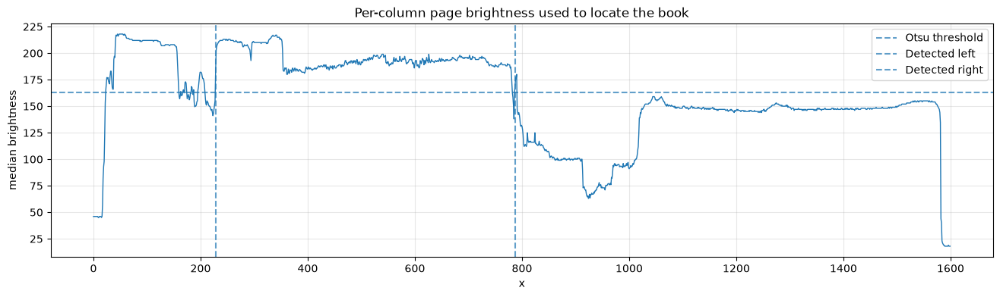

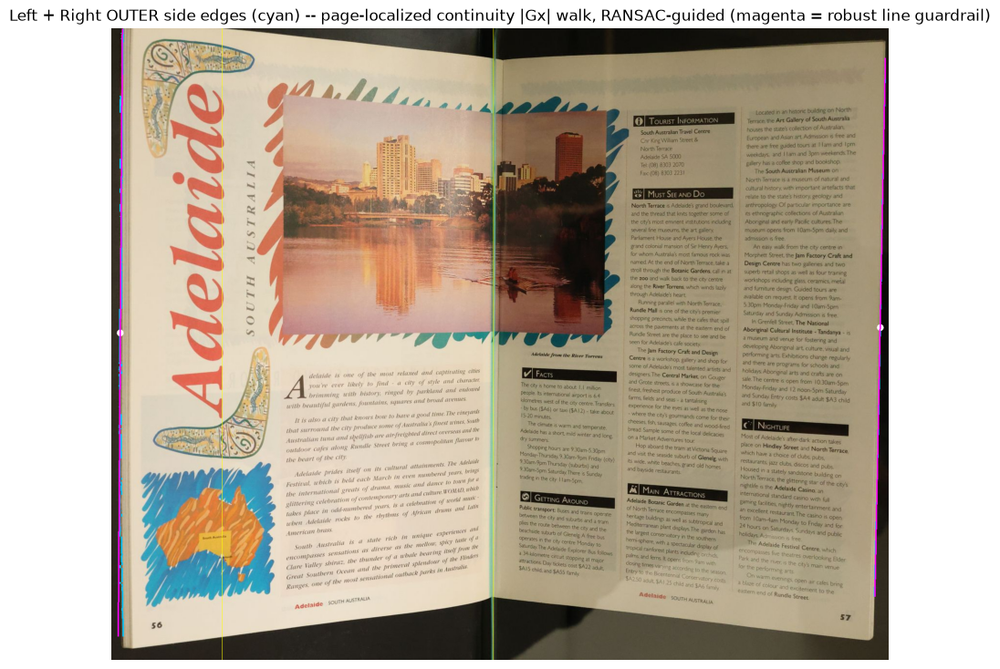

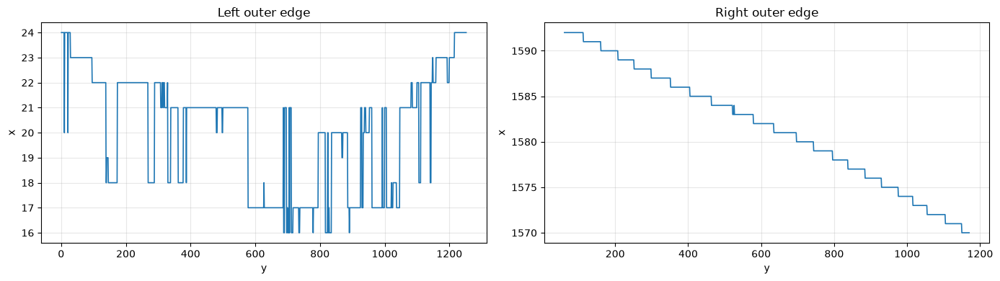

In [317]:
# ============================================================
# CELL 6A: OUTER SIDE EDGES  --  DIAGNOSTIC / BASELINE ONLY
#
# NOT the side-edge detector used by the rest of the pipeline.
# Method 4 (Gx sign-change count + gutter-anchored span + RANSAC-
# guided continuity walk + finger bridging + strength/straightness
# widen-retry, a few cells below) is the actual side-boundary
# detector Cell 6D onward uses -- its wiring cell overwrites
# book_x_lo/book_x_hi/row_top_left/row_bot_left/row_top_right/
# row_bot_right/left_edge_final/right_edge_final with Method 4's
# results right after this cell runs.
#
# This cell is kept only as a comparison baseline: brightness-Otsu
# book-span detection is less robust than Method 4's edge-density
# signal (confirmed failure: a dark on-page photo reads as
# background to a pure brightness split), so run this cell to see
# how the OLDER approach would have done on the same photo, not to
# feed the final crop/dewarp.
#
# Strategy (this cell only):
#
#   1. Use top_edge_final + bottom_edge to estimate the actual
#      vertical extent of the book at every x.
#
#   2. Measure the brightness inside that estimated page area.
#      The black background is dark; the book is bright.
#
#   3. Detect the leftmost/rightmost x where the book actually
#      exists.
#
#   4. Use those locations as the seed/search regions for a
#      RANSAC line fit (robust straight-line estimate of each
#      outer edge from many per-row |Gx| peak candidates, with
#      outliers -- text edges, finger occlusions, noise -- thrown
#      out automatically).
#
#   5. Use the RANSAC line as a GUARDRAIL for the existing
#      continuity-constrained |Gx| walk: it picks a better seed
#      point than a blind argmax, and keeps every walk step
#      anchored near the robust line instead of drifting off onto
#      a nearby strong edge (e.g. a printed rule or text column)
#      one small step at a time. The walk itself still produces
#      the final trace, so real physical bow in the page edge is
#      preserved -- RANSAC only prevents it from being hijacked.
#
# This is deliberately NOT based on a fixed percentage such as
# "outer 20% of image".
# ============================================================


# ------------------------------------------------------------
# 1. Basic dimensions
# ------------------------------------------------------------

Hf, Wf = gray_fp.shape[:2]

print(f"Image: W={Wf}, H={Hf}")


# ------------------------------------------------------------
# 2. Vertical gradient
#
# Gx detects vertical boundaries.
# ------------------------------------------------------------

gx_fp = cv2.Sobel(
    gray_fp,
    cv2.CV_32F,
    1,
    0,
    ksize=3
)

gx_fp_abs = np.abs(gx_fp)


# ------------------------------------------------------------
# 3. Make sure top/bottom arrays have usable lengths
# ------------------------------------------------------------

top_arr = np.asarray(top_edge_final).astype(np.int32)
bot_arr = np.asarray(bottom_edge).astype(np.int32)

if len(top_arr) != Wf:
    raise ValueError(
        f"top_edge_final length {len(top_arr)} != image width {Wf}"
    )

if len(bot_arr) != Wf:
    raise ValueError(
        f"bottom_edge length {len(bot_arr)} != image width {Wf}"
    )


# ------------------------------------------------------------
# 4. Estimate page brightness for every x
#
# We only inspect the region BETWEEN the already-detected
# top and bottom boundaries.
#
# A real page column should contain lots of bright paper.
# Black table/background should score much lower.
#
# We trim 10% from top/bottom to avoid fingers and page-edge
# artifacts influencing the score.
# ------------------------------------------------------------

page_brightness = np.zeros(Wf, dtype=np.float32)
page_height = np.zeros(Wf, dtype=np.float32)

for x in range(Wf):

    top = int(top_arr[x])
    bot = int(bot_arr[x])

    top = max(0, min(Hf - 1, top))
    bot = max(0, min(Hf, bot))

    if bot <= top + 10:
        page_brightness[x] = 0
        page_height[x] = 0
        continue

    h = bot - top

    trim = max(
        3,
        int(h * 0.10)
    )

    y1 = top + trim
    y2 = bot - trim

    if y2 <= y1:
        page_brightness[x] = 0
        page_height[x] = 0
        continue

    page_brightness[x] = np.median(
        gray_fp[y1:y2, x]
    )

    page_height[x] = h


# ------------------------------------------------------------
# 5. Robust threshold for detecting actual page columns
#
# Use Otsu on the per-column brightness profile.
#
# This separates:
#
#       dark background
#              from
#       bright paper
#
# without hardcoding "gray > 100" etc.
# ------------------------------------------------------------

valid_brightness = page_brightness[
    page_height > 20
]

if len(valid_brightness) < 20:
    raise ValueError(
        "Not enough valid columns to detect the book."
    )


# Otsu threshold requires 8-bit data
brightness_u8 = np.clip(
    valid_brightness,
    0,
    255
).astype(np.uint8)

otsu_threshold, _ = cv2.threshold(
    brightness_u8,
    0,
    255,
    cv2.THRESH_BINARY + cv2.THRESH_OTSU
)

print(
    f"Otsu page-brightness threshold: "
    f"{otsu_threshold:.1f}"
)


# ------------------------------------------------------------
# 6. Build page-column mask
# ------------------------------------------------------------

page_mask_x = (
    (page_brightness >= otsu_threshold) &
    (page_height > 20)
)


# 7. Clean small gaps in the 1D page-column mask
#
# OpenCV has no cv2.MORPH_1D.
# Since this is only a 1D signal, use a simple rolling
# majority/maximum filter instead.
# ------------------------------------------------------------

mask = page_mask_x.astype(np.uint8)

kernel_width = max(
    5,
    int(Wf * 0.01)
)

# Make kernel odd
if kernel_width % 2 == 0:
    kernel_width += 1

pad = kernel_width // 2

# Pad using edge values
padded = np.pad(
    mask,
    (pad, pad),
    mode="edge"
)

# Rolling sum
rolling_sum = np.convolve(
    padded,
    np.ones(kernel_width, dtype=np.float32),
    mode="valid"
)

# Majority vote
page_mask_x = (
    rolling_sum >= kernel_width * 0.5
)


# ------------------------------------------------------------
# 8. Find contiguous x-runs
# ------------------------------------------------------------

runs = []

inside = False
start = None

for x in range(Wf):

    if page_mask_x[x] and not inside:
        start = x
        inside = True

    elif not page_mask_x[x] and inside:
        runs.append(
            (start, x)
        )
        inside = False

if inside:
    runs.append(
        (start, Wf)
    )


# ------------------------------------------------------------
# 9. Keep substantial runs only
# ------------------------------------------------------------

min_run_width = max(
    20,
    int(Wf * 0.05)
)

runs = [
    (a, b)
    for a, b in runs
    if (b - a) >= min_run_width
]

if len(runs) == 0:
    raise ValueError(
        "Could not find a substantial bright page region."
    )


print("\nDetected x-runs:")

for a, b in runs:
    print(
        f"  [{a}, {b})  width={b-a}"
    )


# ------------------------------------------------------------
# 10. Select the overall book span
#
# The book should occupy the largest/most substantial
# contiguous bright region.
#
# If gutter shadows split it into multiple pieces, merge
# nearby runs.
# ------------------------------------------------------------

runs_sorted = sorted(
    runs,
    key=lambda r: r[0]
)

merge_gap = max(
    10,
    int(Wf * 0.03)
)

merged_runs = []

for a, b in runs_sorted:

    if not merged_runs:
        merged_runs.append(
            [a, b]
        )
        continue

    prev_a, prev_b = merged_runs[-1]

    if a - prev_b <= merge_gap:

        merged_runs[-1][1] = max(
            prev_b,
            b
        )

    else:
        merged_runs.append(
            [a, b]
        )


# Select largest merged region
book_x_lo, book_x_hi = max(
    merged_runs,
    key=lambda r: r[1] - r[0]
)

print(
    f"\nDetected BOOK span: "
    f"x=[{book_x_lo}, {book_x_hi})"
)


# ------------------------------------------------------------
# 11. Add a small safety margin around detected boundary
#
# We don't want to search the entire image.
#
# But we also don't want to cut off the real edge.
# ------------------------------------------------------------

boundary_margin = max(
    20,
    int(Wf * 0.04)
)

left_search_lo = max(
    0,
    book_x_lo - boundary_margin
)

left_search_hi = min(
    Wf,
    book_x_lo + boundary_margin
)

right_search_lo = max(
    0,
    book_x_hi - boundary_margin
)

right_search_hi = min(
    Wf,
    book_x_hi + boundary_margin
)


print(
    f"Left edge search : "
    f"x=[{left_search_lo}, {left_search_hi})"
)

print(
    f"Right edge search: "
    f"x=[{right_search_lo}, {right_search_hi})"
)


# ============================================================
# 12. Stable seed profile
#
# Use the middle portion of the book vertically.
#
# This avoids fingers near the top and bottom.
# ============================================================

def make_seed_profile(
    gx,
    row_top,
    row_bot
):

    page_h = row_bot - row_top

    band_lo = (
        row_top +
        int(page_h * 0.30)
    )

    band_hi = (
        row_top +
        int(page_h * 0.70)
    )

    band_lo = max(
        0,
        band_lo
    )

    band_hi = min(
        gx.shape[0],
        band_hi
    )

    if band_hi <= band_lo:
        raise ValueError(
            f"Invalid seed band: "
            f"{band_lo}:{band_hi}"
        )

    return np.mean(
        gx[band_lo:band_hi],
        axis=0
    )


# ------------------------------------------------------------
# 13. Find seed
# ------------------------------------------------------------

def find_seed_from_profile(
    profile,
    x_lo,
    x_hi
):

    x_lo = max(
        0,
        int(x_lo)
    )

    x_hi = min(
        len(profile),
        int(x_hi)
    )

    if x_hi <= x_lo:
        raise ValueError(
            f"Invalid seed region: "
            f"{x_lo}:{x_hi}"
        )

    local = profile[x_lo:x_hi]

    return (
        x_lo +
        int(np.argmax(local))
    )


# ============================================================
# 14. Continuity-constrained vertical trace
# ============================================================

def trace_side_edge(
    gx,
    row_lo,
    row_hi,
    seed_x,
    x_lo,
    x_hi,
    max_step=6,
    guide_m=None,
    guide_b=None,
    guide_tolerance=15
):

    row_lo = max(
        0,
        int(row_lo)
    )

    row_hi = min(
        gx.shape[0],
        int(row_hi)
    )

    x_lo = max(
        0,
        int(x_lo)
    )

    x_hi = min(
        gx.shape[1],
        int(x_hi)
    )

    if row_hi <= row_lo:
        raise ValueError(
            "Invalid vertical trace range."
        )

    if x_hi <= x_lo:
        raise ValueError(
            "Invalid horizontal trace range."
        )

    n = row_hi - row_lo

    edge_x = np.zeros(
        n,
        dtype=np.int32
    )

    seed_row = (
        row_lo +
        n // 2
    )

    seed_x = int(
        np.clip(
            seed_x,
            x_lo,
            x_hi - 1
        )
    )

    edge_x[
        seed_row - row_lo
    ] = seed_x


    # --------------------------------------------------------
    # Walk DOWN
    #
    # If a guide line is available, each row's search window is
    # centered on max_step around whichever is nearer: the
    # previous accepted x, or the guide line's predicted x at this
    # row (clamped so the window never drifts more than
    # guide_tolerance px from the guide -- this is what actually
    # stops a hijacked step from compounding).
    # --------------------------------------------------------

    prev = seed_x

    for y in range(
        seed_row + 1,
        row_hi
    ):

        center = prev

        if guide_m is not None:
            guide_x = guide_m * y + guide_b
            if abs(center - guide_x) > guide_tolerance:
                center = guide_x + np.clip(
                    center - guide_x,
                    -guide_tolerance,
                    guide_tolerance,
                )

        center = int(round(center))

        lo = max(
            x_lo,
            center - max_step
        )

        hi = min(
            x_hi,
            center + max_step + 1
        )

        window = gx[y, lo:hi]

        if window.size == 0:
            edge_x[y - row_lo] = prev
            continue

        prev = (
            lo +
            int(np.argmax(window))
        )

        edge_x[y - row_lo] = prev


    # --------------------------------------------------------
    # Walk UP (same guide-line guardrail as the downward walk)
    # --------------------------------------------------------

    prev = seed_x

    for y in range(
        seed_row - 1,
        row_lo - 1,
        -1
    ):

        center = prev

        if guide_m is not None:
            guide_x = guide_m * y + guide_b
            if abs(center - guide_x) > guide_tolerance:
                center = guide_x + np.clip(
                    center - guide_x,
                    -guide_tolerance,
                    guide_tolerance,
                )

        center = int(round(center))

        lo = max(
            x_lo,
            center - max_step
        )

        hi = min(
            x_hi,
            center + max_step + 1
        )

        window = gx[y, lo:hi]

        if window.size == 0:
            edge_x[y - row_lo] = prev
            continue

        prev = (
            lo +
            int(np.argmax(window))
        )

        edge_x[y - row_lo] = prev


    return edge_x


# ============================================================
# 14.5 RANSAC line fit -- robust straight-line guide for each
# outer edge, used as a guardrail for the walk below (steps 16/17).
#
# For each side, sample the strongest |Gx| peak per row within
# that side's boundary_margin search window (step 11), across the
# full top/bottom span of the book (not just one seed row). Fit a
# robust line (RANSAC: many random 2-point line hypotheses, keep
# the one with the most inliers) through those candidates. Rows
# where the true peak is text, a finger, or noise become outliers
# and get rejected automatically -- no hand-tuned confidence
# threshold needed.
# ============================================================

def ransac_line_fit(points, n_iter=300, inlier_thresh=4.0, seed=0):
    """Fit x = m*y + b through (y, x) points, robust to outliers.
    Returns (None, None) if too few points/inliers to fit."""
    rng = np.random.default_rng(seed)
    pts = np.asarray(points, dtype=np.float64)
    if len(pts) < 2:
        return None, None
    best_inliers = None
    best_count = -1
    for _ in range(n_iter):
        i1, i2 = rng.choice(len(pts), size=2, replace=False)
        (y1, x1), (y2, x2) = pts[i1], pts[i2]
        if y1 == y2:
            continue
        m = (x2 - x1) / (y2 - y1)
        b = x1 - m * y1
        pred_x = m * pts[:, 0] + b
        residual = np.abs(pts[:, 1] - pred_x)
        inliers = residual < inlier_thresh
        count = np.sum(inliers)
        if count > best_count:
            best_count = count
            best_inliers = inliers
    if best_inliers is None or best_inliers.sum() < 2:
        return None, None
    inlier_pts = pts[best_inliers]
    m, b = np.polyfit(inlier_pts[:, 0], inlier_pts[:, 1], 1)
    return m, b


def collect_ransac_candidates(gx, row_lo, row_hi, x_lo, x_hi, step=3):
    """Strongest |Gx| peak per sampled row, within [x_lo, x_hi)."""
    points = []
    for y in range(row_lo, row_hi, step):
        window = gx[y, x_lo:x_hi]
        if window.size == 0:
            continue
        x_peak = x_lo + int(np.argmax(window))
        points.append((y, x_peak))
    return points


ransac_row_lo = int(Hf * 0.15)
ransac_row_hi = int(Hf * 0.85)

# Search from the GUTTER outward to the image edges, not just the
# narrow +-boundary_margin window around book_x_lo/book_x_hi.
#
# Bug found by comparing this cell's result against the standalone
# Method 6 test: that test searches each entire half-image (gutter
# to image edge) and correctly finds the true outer edges, because
# RANSAC's outlier rejection is what makes a wide search safe -- it
# throws out the many per-row peaks that land on text/photos and
# keeps only the ones that agree on a straight line, which the true
# page edge (a long, page-height-spanning contrast boundary) always
# does far more consistently than any interior print element.
#
# Restricting the search to boundary_margin around book_x_lo/
# book_x_hi defeats that: if step 5-10's brightness-Otsu span is
# already wrong (confirmed failure mode -- a dark on-page photo
# reads as background), RANSAC then just robustly re-confirms the
# WRONG narrow window instead of being able to correct it.
gutter_col_for_ransac = int(
    np.clip(gutter_x_global - left_cut, 0, Wf - 1)
)

left_ransac_pts = collect_ransac_candidates(
    gx_fp_abs, ransac_row_lo, ransac_row_hi,
    0, gutter_col_for_ransac,
)

right_ransac_pts = collect_ransac_candidates(
    gx_fp_abs, ransac_row_lo, ransac_row_hi,
    gutter_col_for_ransac, Wf,
)

m_left_guide, b_left_guide = ransac_line_fit(left_ransac_pts)
m_right_guide, b_right_guide = ransac_line_fit(right_ransac_pts)

print(
    f"Left RANSAC guide  : "
    f"{'x = %.4f*y + %.2f' % (m_left_guide, b_left_guide) if m_left_guide is not None else 'fit failed -- falling back to unguided walk'}"
)

print(
    f"Right RANSAC guide : "
    f"{'x = %.4f*y + %.2f' % (m_right_guide, b_right_guide) if m_right_guide is not None else 'fit failed -- falling back to unguided walk'}"
)


# ============================================================
# 15. Determine top/bottom rows for each outer edge
# ============================================================

row_top_left = int(
    np.median(
        top_arr[
            max(0, book_x_lo):
            min(Wf, book_x_lo + 10)
        ]
    )
)

row_bot_left = int(
    np.median(
        bot_arr[
            max(0, book_x_lo):
            min(Wf, book_x_lo + 10)
        ]
    )
)


row_top_right = int(
    np.median(
        top_arr[
            max(0, book_x_hi - 10):
            min(Wf, book_x_hi)
        ]
    )
)

row_bot_right = int(
    np.median(
        bot_arr[
            max(0, book_x_hi - 10):
            min(Wf, book_x_hi)
        ]
    )
)


# Safety clamp
row_top_left = max(
    0,
    min(Hf - 1, row_top_left)
)

row_bot_left = max(
    row_top_left + 1,
    min(Hf, row_bot_left)
)

row_top_right = max(
    0,
    min(Hf - 1, row_top_right)
)

row_bot_right = max(
    row_top_right + 1,
    min(Hf, row_bot_right)
)


# ============================================================
# 16. LEFT OUTER EDGE
# ============================================================

left_profile = make_seed_profile(
    gx_fp_abs,
    row_top_left,
    row_bot_left
)

# When RANSAC succeeded, trust its own (wider, gutter-to-edge)
# search window instead of clamping back into the narrow
# boundary_margin window around book_x_lo -- otherwise a correct
# RANSAC fit outside that narrow window gets clamped back into a
# wrong location if step 5-10's span detection was off.
if m_left_guide is not None:
    left_seed_row = (row_top_left + row_bot_left) // 2
    left_seed_x = int(round(m_left_guide * left_seed_row + b_left_guide))
    left_walk_lo = max(0, left_seed_x - boundary_margin)
    left_walk_hi = min(Wf, left_seed_x + boundary_margin)
    left_seed_x = int(np.clip(left_seed_x, left_walk_lo, left_walk_hi - 1))
else:
    left_seed_x = find_seed_from_profile(
        left_profile,
        left_search_lo,
        left_search_hi
    )
    left_walk_lo, left_walk_hi = left_search_lo, left_search_hi

left_edge_final = trace_side_edge(
    gx_fp_abs,
    row_top_left,
    row_bot_left,
    left_seed_x,
    left_walk_lo,
    left_walk_hi,
    max_step=6,
    guide_m=m_left_guide,
    guide_b=b_left_guide,
)


# ============================================================
# 17. RIGHT OUTER EDGE
# ============================================================

right_profile = make_seed_profile(
    gx_fp_abs,
    row_top_right,
    row_bot_right
)

# Same fix as the left side: trust RANSAC's own wider window.
if m_right_guide is not None:
    right_seed_row = (row_top_right + row_bot_right) // 2
    right_seed_x = int(round(m_right_guide * right_seed_row + b_right_guide))
    right_walk_lo = max(0, right_seed_x - boundary_margin)
    right_walk_hi = min(Wf, right_seed_x + boundary_margin)
    right_seed_x = int(np.clip(right_seed_x, right_walk_lo, right_walk_hi - 1))
else:
    right_seed_x = find_seed_from_profile(
        right_profile,
        right_search_lo,
        right_search_hi
    )
    right_walk_lo, right_walk_hi = right_search_lo, right_search_hi

right_edge_final = trace_side_edge(
    gx_fp_abs,
    row_top_right,
    row_bot_right,
    right_seed_x,
    right_walk_lo,
    right_walk_hi,
    max_step=6,
    guide_m=m_right_guide,
    guide_b=b_right_guide,
)


# ============================================================
# 18. Diagnostics
# ============================================================

print("\n========================================")
print("OUTER EDGE RESULTS")
print("========================================")

print(
    f"Book x span       : "
    f"{book_x_lo} -> {book_x_hi}"
)

print(
    f"Left seed         : "
    f"x={left_seed_x}"
)

print(
    f"Right seed        : "
    f"x={right_seed_x}"
)

print(
    f"Left trace range  : "
    f"{left_edge_final.min()} -> "
    f"{left_edge_final.max()}"
)

print(
    f"Right trace range : "
    f"{right_edge_final.min()} -> "
    f"{right_edge_final.max()}"
)


# ============================================================
# 19. Visualize detected page columns
# ============================================================

plt.figure(figsize=(16, 4))

plt.plot(
    page_brightness,
    linewidth=1
)

plt.axhline(
    otsu_threshold,
    linestyle="--",
    alpha=0.7,
    label="Otsu threshold"
)

plt.axvline(
    book_x_lo,
    linestyle="--",
    alpha=0.7,
    label="Detected left"
)

plt.axvline(
    book_x_hi,
    linestyle="--",
    alpha=0.7,
    label="Detected right"
)

plt.title(
    "Per-column page brightness used to locate the book"
)

plt.xlabel("x")
plt.ylabel("median brightness")

plt.grid(alpha=0.3)
plt.legend()

plt.show()


# ============================================================
# 20. Overlay final side traces
# ============================================================

vis = cv2.cvtColor(
    img,
    cv2.COLOR_BGR2RGB
).copy()


# ------------------------------------------------------------
# Left edge
# ------------------------------------------------------------

for i, y in enumerate(
    range(
        row_top_left,
        row_bot_left
    )
):

    x = int(
        left_edge_final[i]
    )

    vis[
        y,
        max(0, x - 1):
        min(Wf, x + 2)
    ] = [0, 200, 255]


# ------------------------------------------------------------
# Right edge
# ------------------------------------------------------------

for i, y in enumerate(
    range(
        row_top_right,
        row_bot_right
    )
):

    x = int(
        right_edge_final[i]
    )

    vis[
        y,
        max(0, x - 1):
        min(Wf, x + 2)
    ] = [0, 200, 255]


# ------------------------------------------------------------
# Detected book boundaries / seeds
# ------------------------------------------------------------

cv2.line(
    vis,
    (book_x_lo, 0),
    (book_x_lo, Hf - 1),
    (255, 255, 0),
    1
)

cv2.line(
    vis,
    (book_x_hi - 1, 0),
    (book_x_hi - 1, Hf - 1),
    (255, 255, 0),
    1
)

cv2.circle(
    vis,
    (
        int(left_seed_x),
        int((row_top_left + row_bot_left) / 2)
    ),
    7,
    (255, 255, 255),
    -1
)

cv2.circle(
    vis,
    (
        int(right_seed_x),
        int((row_top_right + row_bot_right) / 2)
    ),
    7,
    (255, 255, 255),
    -1
)


# ------------------------------------------------------------
# RANSAC guide lines (magenta) -- the robust straight-line
# estimate used to seed/guardrail the walk above. Drawn alongside
# the actual walked trace (cyan) so any divergence between "robust
# line" and "walked curve" is visible at a glance: large agreement
# is expected (the guide constrains the walk), a real physical bow
# in the page shows as the cyan trace gently deviating from the
# straight magenta line, and a walk that still drifted far from
# its own guide line signals a genuinely bad row (rare, since the
# guardrail actively prevents this).
# ------------------------------------------------------------

if m_left_guide is not None:
    for y in range(row_top_left, row_bot_left):
        x = int(round(m_left_guide * y + b_left_guide))
        if 0 <= x < Wf:
            vis[y, max(0, x - 1):min(Wf, x + 2)] = [255, 0, 255]

if m_right_guide is not None:
    for y in range(row_top_right, row_bot_right):
        x = int(round(m_right_guide * y + b_right_guide))
        if 0 <= x < Wf:
            vis[y, max(0, x - 1):min(Wf, x + 2)] = [255, 0, 255]


# ============================================================
# 21. Display
# ============================================================

plt.figure(figsize=(16, 9))

plt.imshow(vis)

plt.title(
    "Left + Right OUTER side edges "
    "(cyan) -- page-localized continuity |Gx| walk, "
    "RANSAC-guided (magenta = robust line guardrail)"
)

plt.axis("off")

plt.show()


# ============================================================
# 22. Trace plots
# ============================================================

fig, axes = plt.subplots(
    1,
    2,
    figsize=(14, 4)
)


axes[0].plot(
    range(row_top_left, row_bot_left),
    left_edge_final,
    linewidth=1.2
)

axes[0].set_title(
    "Left outer edge"
)

axes[0].set_xlabel("y")
axes[0].set_ylabel("x")

axes[0].grid(alpha=0.3)


axes[1].plot(
    range(row_top_right, row_bot_right),
    right_edge_final,
    linewidth=1.2
)

axes[1].set_title(
    "Right outer edge"
)

axes[1].set_xlabel("y")
axes[1].set_ylabel("x")

axes[1].grid(alpha=0.3)


plt.tight_layout()
plt.show()

In [318]:
# ============================================================
# TEST HARNESS (shared helper for Cells 6A-M1 .. 6A-M10)
#
# Each method below computes a per-column score profile from
# gray_fp / gx_fp / gx_fp_abs (already computed in Cell 6A),
# derives a book_x_lo/book_x_hi span from it via Otsu (or an
# equivalent data-driven split -- NOT a hardcoded threshold),
# and plots the profile + detected span for visual comparison
# against Cell 6A's brightness-based result.
#
# None of these cells mutate book_x_lo/book_x_hi/page_mask_x etc.
# used downstream in Cell 6A itself -- they use their own
# `_m{n}` suffixed names so Cell 6A's real output is untouched.
# ============================================================

def otsu_split(profile, valid_mask):
    """Same approach as Cell 6A step 5: Otsu on the valid portion
    of a per-column profile. Works on any scalar profile, not just
    brightness."""
    valid = profile[valid_mask]
    if len(valid) < 20:
        raise ValueError("Not enough valid columns for Otsu split.")
    lo, hi = valid.min(), valid.max()
    if hi <= lo:
        raise ValueError("Profile has no dynamic range to split.")
    scaled = ((valid - lo) / (hi - lo) * 255.0).astype(np.uint8)
    t_u8, _ = cv2.threshold(scaled, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    threshold = lo + (t_u8 / 255.0) * (hi - lo)
    return threshold

def clean_mask_1d(mask_bool, Wf):
    """Same rolling-majority cleanup as Cell 6A step 7."""
    mask = mask_bool.astype(np.uint8)
    kernel_width = max(5, int(Wf * 0.01))
    if kernel_width % 2 == 0:
        kernel_width += 1
    pad = kernel_width // 2
    padded = np.pad(mask, (pad, pad), mode="edge")
    rolling_sum = np.convolve(padded, np.ones(kernel_width, dtype=np.float32), mode="valid")
    return rolling_sum >= kernel_width * 0.5

def find_book_span(mask_bool, Wf, gutter_x=None):
    """Run-finding + merge, same as Cell 6A steps 8-10, but the
    final span is chosen by walking OUTWARD FROM THE GUTTER rather
    than picking whichever merged run happens to be widest.

    Why: a "widest run wins" rule can land on a high-activity blob
    in the middle of ONE page (e.g. a photo or dense text block)
    that has nothing to do with either outer edge -- confirmed on
    Method 4's sign-change profile, where the passing-mask blob
    that won was entirely inside the page interior, well short of
    the real left/right edges. The gutter position is already known
    (gutter_x_global) and physically has to sit strictly between the
    two true outer edges, so anchoring the search there and reading
    off each run's OUTER end (not just "widest run") is guaranteed
    to reach the real edges as long as the mask is correct near the
    gutter and doesn't have a false gap all the way out.

    If gutter_x is None, falls back to the old widest-run behavior
    (used by callers that don't have a meaningful gutter, if any).
    """
    runs = []
    inside = False
    start = None
    for x in range(Wf):
        if mask_bool[x] and not inside:
            start = x
            inside = True
        elif not mask_bool[x] and inside:
            runs.append((start, x))
            inside = False
    if inside:
        runs.append((start, Wf))

    min_run_width = max(20, int(Wf * 0.05))
    runs = [(a, b) for a, b in runs if (b - a) >= min_run_width]
    if not runs:
        return None

    runs_sorted = sorted(runs, key=lambda r: r[0])
    merge_gap = max(10, int(Wf * 0.03))
    merged = []
    for a, b in runs_sorted:
        if not merged:
            merged.append([a, b])
            continue
        prev_a, prev_b = merged[-1]
        if a - prev_b <= merge_gap:
            merged[-1][1] = max(prev_b, b)
        else:
            merged.append([a, b])

    if gutter_x is None:
        return tuple(max(merged, key=lambda r: r[1] - r[0]))

    gutter_x = int(np.clip(gutter_x, 0, Wf - 1))

    left_runs = [(a, b) for a, b in merged if a <= gutter_x]
    right_runs = [(a, b) for a, b in merged if b > gutter_x]

    if not left_runs or not right_runs:
        # Gutter isn't bracketed by a run on both sides -- fall back
        # to widest-run so we still return *something* diagnostic,
        # but this case means the mask itself failed near the spine.
        return tuple(max(merged, key=lambda r: r[1] - r[0]))

    # Left run: the one whose right end is closest to (at/before) the
    # gutter -- i.e. the run that actually abuts the spine from the
    # left. Its LEFT end is the true left outer edge.
    left_run = max(left_runs, key=lambda r: r[1])
    # Right run: the one whose left end is closest to (at/after) the
    # gutter. Its RIGHT end is the true right outer edge.
    right_run = min(right_runs, key=lambda r: r[0])

    return (left_run[0], right_run[1])

def plot_method(profile, valid_mask, threshold, span, title, ylabel):
    plt.figure(figsize=(16, 4))
    plt.plot(profile, linewidth=1)
    plt.axhline(threshold, linestyle="--", alpha=0.7, label="Otsu threshold")
    if span is not None:
        plt.axvline(span[0], linestyle="--", alpha=0.7, color="green", label="Detected left")
        plt.axvline(span[1], linestyle="--", alpha=0.7, color="red", label="Detected right")
    plt.title(title)
    plt.xlabel("x")
    plt.ylabel(ylabel)
    plt.grid(alpha=0.3)
    plt.legend()
    plt.show()
    if span is not None:
        print(f"Detected span: x=[{span[0]}, {span[1]})  width={span[1]-span[0]}")
    else:
        print("No span detected.")


def show_span_on_book(span, title):
    """Overlay a detected book x-span directly on the actual photo,
    same style as Cell 6A step 20/21 -- so the impact of each method
    is visible on the real image, not just an abstract profile plot."""
    vis = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).copy()

    if span is not None:
        x_lo, x_hi = span
        cv2.line(vis, (x_lo, 0), (x_lo, Hf - 1), (0, 255, 0), 4)
        cv2.line(vis, (x_hi - 1, 0), (x_hi - 1, Hf - 1), (255, 0, 0), 4)
        overlay = vis.copy()
        cv2.rectangle(overlay, (0, 0), (x_lo, Hf - 1), (0, 0, 0), -1)
        cv2.rectangle(overlay, (x_hi, 0), (Wf - 1, Hf - 1), (0, 0, 0), -1)
        vis = cv2.addWeighted(overlay, 0.35, vis, 0.65, 0)

    plt.figure(figsize=(16, 9))
    plt.imshow(vis)
    plt.title(title + ("" if span is not None else " -- NO SPAN DETECTED"))
    plt.axis("off")
    plt.show()


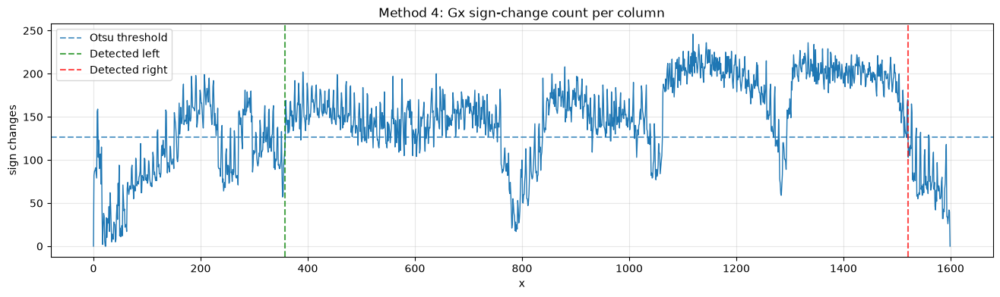

Detected span: x=[358, 1521)  width=1163


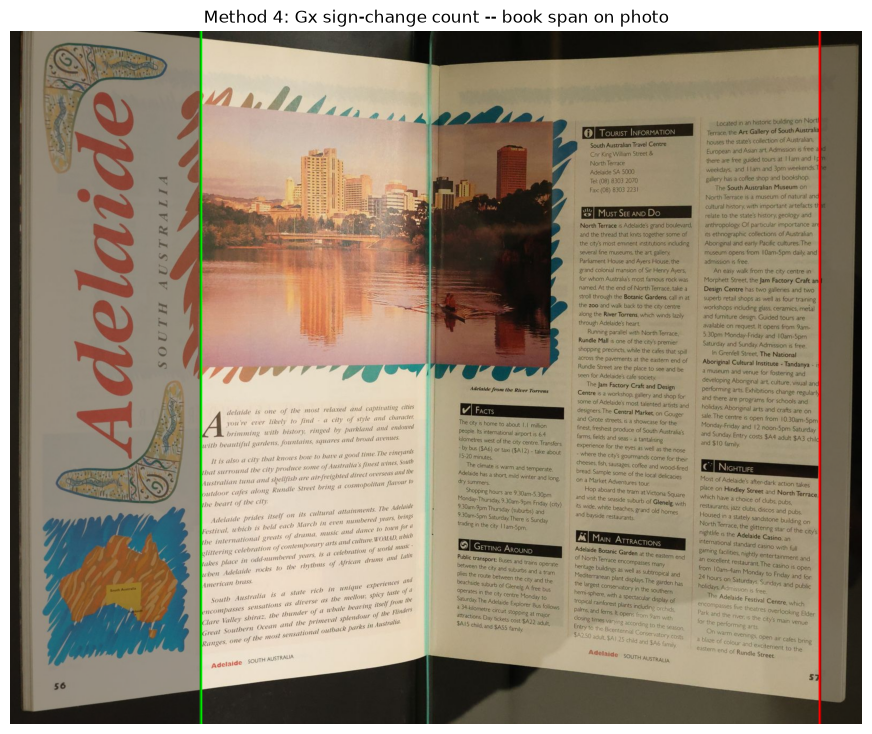

Left : excluded 175 / 1221 rows as diagram/line-art
Right: excluded 350 / 1228 rows as diagram/line-art
Left guide  : x = -0.0339*y + 366.85
Right guide : x = -0.0151*y + 1589.91


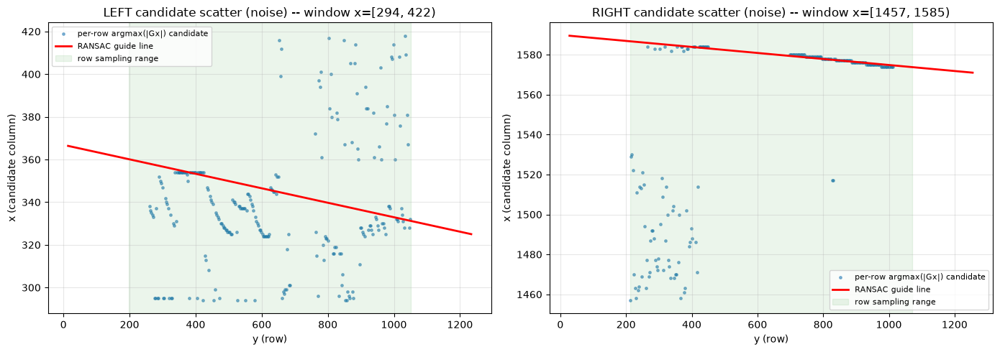

Left edge : bridged 443 / 1221 low-confidence (finger) rows locally
Right edge: bridged 393 / 1228 low-confidence (finger) rows locally
Left  gutter distance: 453.0px   straightness residual std: 7.61px   edge strength: 124.0
Right gutter distance: 781.0px   straightness residual std: 1.84px   edge strength: 501.0
Left side not yet strong/straight/symmetric enough -- widening margin to 128px
Left side not yet strong/straight/symmetric enough -- widening margin to 256px
Left side not yet strong/straight/symmetric enough -- widening margin to 358px (reached image edge)
FINAL -- Right gutter distance: 781.0px   straightness residual std: 1.84px


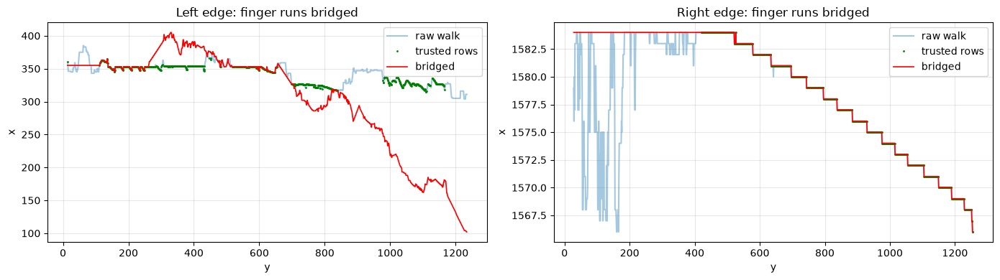

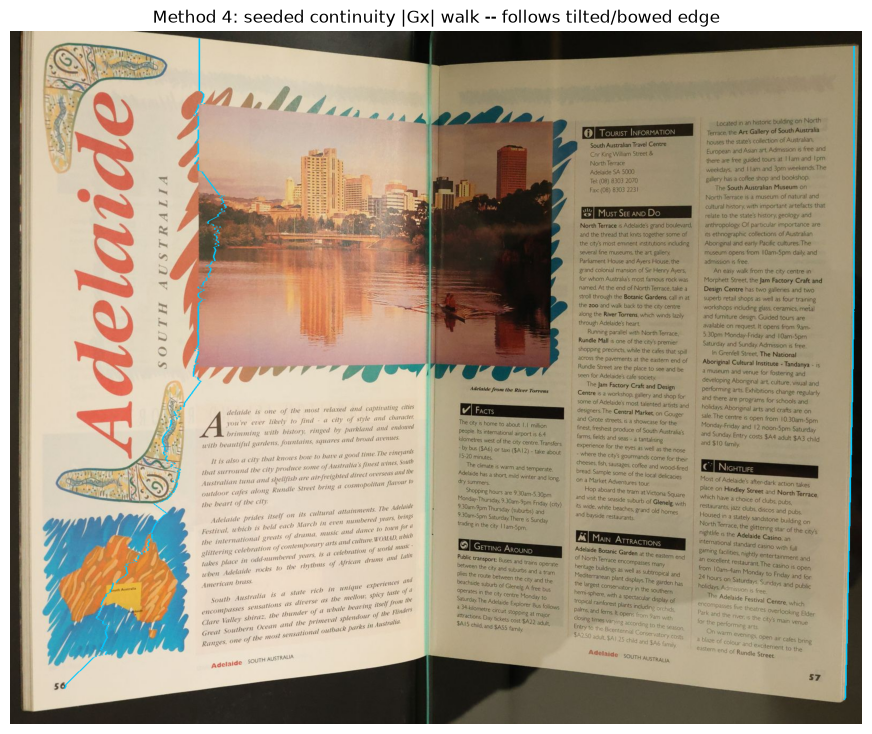

In [319]:
# ============================================================
# METHOD 4 TEST: Gx sign-change count per column
#
# Count how many times Gx changes sign (dark->light->dark...)
# down each column. Printed text produces frequent alternation
# (many strokes); flat background produces almost none. Purely
# structural -- immune to absolute brightness/exposure, unlike
# Cell 6A's median-brightness approach.
# ============================================================

signchange_m4 = np.zeros(Wf, dtype=np.float32)
height_m4 = np.zeros(Wf, dtype=np.float32)

for x in range(Wf):
    top = max(0, min(Hf - 1, int(top_arr[x])))
    bot = max(0, min(Hf, int(bot_arr[x])))
    if bot <= top + 10:
        continue
    h = bot - top
    trim = max(3, int(h * 0.10))
    y1, y2 = top + trim, bot - trim
    if y2 <= y1:
        continue

    col = gx_fp[y1:y2, x]
    signs = np.sign(col)
    signs = signs[signs != 0]
    if len(signs) < 2:
        continue
    signchange_m4[x] = np.sum(np.diff(signs) != 0)
    height_m4[x] = h

valid_m4 = height_m4 > 20
threshold_m4 = otsu_split(signchange_m4, valid_m4)
mask_m4 = (signchange_m4 >= threshold_m4) & valid_m4
mask_m4 = clean_mask_1d(mask_m4, Wf)
span_m4 = find_book_span(mask_m4, Wf, gutter_x=gutter_x_global - left_cut)

plot_method(
    signchange_m4, valid_m4, threshold_m4, span_m4,
    "Method 4: Gx sign-change count per column",
    "sign changes",
)


show_span_on_book(span_m4, "Method 4: Gx sign-change count -- book span on photo")


# ============================================================
# Method 4 EDGE TRACE: feed span_m4 into the same continuity-
# constrained |Gx| walk Cell 6A uses (trace_side_edge), instead of
# stopping at a flat vertical line. The book in this photo is
# visibly tilted, so a single x per side cuts into the page at the
# top or bottom -- the walk follows the real (possibly tilted or
# bowed) edge the way Cell 4B/4C already do for the top/bottom
# edges, just applied to the sides using span_m4's x as the seed
# instead of RANSAC's line fit or the brightness-Otsu span.
# ============================================================

assert "trace_side_edge" in dir() and "ransac_line_fit" in dir() and "collect_ransac_candidates" in dir(), \
    "Run Cell 6A first -- this reuses its walk function and RANSAC guardrail helpers."

if span_m4 is not None:
    m4_book_x_lo, m4_book_x_hi = span_m4

    m4_row_top_left = int(np.median(
        top_arr[max(0, m4_book_x_lo):min(Wf, m4_book_x_lo + 10)]
    ))
    m4_row_bot_left = int(np.median(
        bot_arr[max(0, m4_book_x_lo):min(Wf, m4_book_x_lo + 10)]
    ))
    m4_row_top_right = int(np.median(
        top_arr[max(0, m4_book_x_hi - 10):min(Wf, m4_book_x_hi)]
    ))
    m4_row_bot_right = int(np.median(
        bot_arr[max(0, m4_book_x_hi - 10):min(Wf, m4_book_x_hi)]
    ))

    m4_row_top_left = max(0, min(Hf - 1, m4_row_top_left))
    m4_row_bot_left = max(m4_row_top_left + 1, min(Hf, m4_row_bot_left))
    m4_row_top_right = max(0, min(Hf - 1, m4_row_top_right))
    m4_row_bot_right = max(m4_row_top_right + 1, min(Hf, m4_row_bot_right))

    m4_margin = max(20, int(Wf * 0.04))

    # ------------------------------------------------------------
    # RANSAC guardrail (same technique as Cell 6A steps 16/17): a
    # plain seeded walk gets hijacked by strong-but-wrong |Gx| edges
    # (dense text strokes sitting close to the true page margin --
    # confirmed failure mode: the walk chased text into a jagged
    # sawtooth instead of following the near-straight true edge).
    # Fit a robust line through many per-row peak candidates first
    # (outlier rows -- individual text strokes -- get outvoted by
    # the majority that agree on the one straight true edge), then
    # pass that line into trace_side_edge as a guide so every row's
    # search window is pulled back toward it instead of drifting.
    # ------------------------------------------------------------

    # ------------------------------------------------------------
    # Diagram/line-art exclusion: a flowchart's box borders are long,
    # STRAIGHT, high-contrast vertical/near-vertical lines -- exactly
    # what RANSAC treats as a trustworthy signal, but drawn well
    # INSIDE the page, not at the true margin. On a mostly-blank page
    # (this photo's left side) the true edge has few strong |Gx|
    # candidates to begin with, so a diagram's self-consistent box
    # edge can out-vote the sparse, weak true-edge signal.
    #
    # Fix: detect long straight line segments via Hough transform
    # within the search window BEFORE collecting RANSAC candidates,
    # and exclude any row whose window overlaps a detected diagram
    # line from more than roughly its own margin -- same spirit as
    # Cell 4D excluding finger-covered columns, but for a known
    # confounder (line art) instead of low confidence.
    # ------------------------------------------------------------

    def detect_diagram_line_mask(gray, row_lo, row_hi, x_lo, x_hi,
                                   min_line_length_frac=0.05):
        """Returns a boolean array (one per row in [row_lo, row_hi))
        marking rows that intersect a long straight line segment
        detected via Hough transform inside [x_lo, x_hi) -- i.e. rows
        likely to contain diagram/line-art edges, not the true page
        margin."""
        n = row_hi - row_lo
        band = gray[row_lo:row_hi, x_lo:x_hi]
        if band.size == 0:
            return np.zeros(n, dtype=bool)

        edges = cv2.Canny(band, 50, 150)
        min_len = max(15, int(n * min_line_length_frac))
        lines = cv2.HoughLinesP(
            edges, 1, np.pi / 180,
            threshold=40, minLineLength=min_len, maxLineGap=5,
        )

        mask = np.zeros(n, dtype=bool)
        if lines is None:
            return mask

        # cv2.HoughLinesP's return shape has varied across OpenCV
        # builds (N,1,4) vs (N,4) in the wild) -- reshape defensively
        # instead of assuming lines[:, 0] gives 4-tuples.
        lines = np.asarray(lines).reshape(-1, 4)

        for (x1, y1, x2, y2) in lines:
            # Only long, near-VERTICAL lines are candidate box borders
            # that could be mistaken for the page edge (the true edge
            # walk only ever considers near-vertical candidates too).
            length = np.hypot(x2 - x1, y2 - y1)
            if length < min_len:
                continue
            if abs(x2 - x1) > abs(y2 - y1) * 0.3:
                continue  # not near-vertical enough to be a confusable edge
            y_lo, y_hi = sorted((y1, y2))
            mask[max(0, y_lo):min(n, y_hi + 1)] = True

        return mask

    m4_left_diagram_mask = detect_diagram_line_mask(
        gray_fp,
        m4_row_top_left, m4_row_bot_left,
        max(0, m4_book_x_lo - m4_margin), min(Wf, m4_book_x_lo + m4_margin),
    )

    m4_right_diagram_mask = detect_diagram_line_mask(
        gray_fp,
        m4_row_top_right, m4_row_bot_right,
        max(0, m4_book_x_hi - m4_margin), min(Wf, m4_book_x_hi + m4_margin),
    )

    print(
        f"Left : excluded {np.count_nonzero(m4_left_diagram_mask)} / "
        f"{len(m4_left_diagram_mask)} rows as diagram/line-art"
    )
    print(
        f"Right: excluded {np.count_nonzero(m4_right_diagram_mask)} / "
        f"{len(m4_right_diagram_mask)} rows as diagram/line-art"
    )

    def collect_ransac_candidates_excluding(gx, row_lo, row_hi, x_lo, x_hi,
                                              exclude_mask, step=3):
        """Same as collect_ransac_candidates, but skips rows flagged
        in exclude_mask (indexed relative to row_lo)."""
        points = []
        for y in range(row_lo, row_hi, step):
            if exclude_mask[y - row_lo]:
                continue
            window = gx[y, x_lo:x_hi]
            if window.size == 0:
                continue
            x_peak = x_lo + int(np.argmax(window))
            points.append((y, x_peak))
        return points

    m4_ransac_row_lo = m4_row_top_left + int((m4_row_bot_left - m4_row_top_left) * 0.15)
    m4_ransac_row_hi = m4_row_top_left + int((m4_row_bot_left - m4_row_top_left) * 0.85)

    left_ransac_pts_m4 = collect_ransac_candidates_excluding(
        gx_fp_abs, m4_ransac_row_lo, m4_ransac_row_hi,
        max(0, m4_book_x_lo - m4_margin), min(Wf, m4_book_x_lo + m4_margin),
        m4_left_diagram_mask[
            (m4_ransac_row_lo - m4_row_top_left):(m4_ransac_row_hi - m4_row_top_left)
        ] if len(m4_left_diagram_mask) else np.zeros(m4_ransac_row_hi - m4_ransac_row_lo, dtype=bool),
    )
    # Tighter inlier tolerance + more iterations: on a weak-signal
    # margin (blank page, few strong |Gx| candidates), the default
    # 4px/300-iter fit was loose enough to accept a noisy, sloped
    # 'majority' instead of forcing a tighter, more selective
    # consensus -- confirmed by a 0.03 slope (~31px drift over the
    # page height) despite the true edge being close to vertical.
    m4_left_guide_m, m4_left_guide_b = ransac_line_fit(
        left_ransac_pts_m4, n_iter=1000, inlier_thresh=2.0
    )

    m4_ransac_row_lo_r = m4_row_top_right + int((m4_row_bot_right - m4_row_top_right) * 0.15)
    m4_ransac_row_hi_r = m4_row_top_right + int((m4_row_bot_right - m4_row_top_right) * 0.85)

    right_ransac_pts_m4 = collect_ransac_candidates_excluding(
        gx_fp_abs, m4_ransac_row_lo_r, m4_ransac_row_hi_r,
        max(0, m4_book_x_hi - m4_margin), min(Wf, m4_book_x_hi + m4_margin),
        m4_right_diagram_mask[
            (m4_ransac_row_lo_r - m4_row_top_right):(m4_ransac_row_hi_r - m4_row_top_right)
        ] if len(m4_right_diagram_mask) else np.zeros(m4_ransac_row_hi_r - m4_ransac_row_lo_r, dtype=bool),
    )
    m4_right_guide_m, m4_right_guide_b = ransac_line_fit(
        right_ransac_pts_m4, n_iter=1000, inlier_thresh=2.0
    )

    print(
        f"Left guide  : "
        f"{'x = %.4f*y + %.2f' % (m4_left_guide_m, m4_left_guide_b) if m4_left_guide_m is not None else 'fit failed -- unguided walk'}"
    )
    print(
        f"Right guide : "
        f"{'x = %.4f*y + %.2f' % (m4_right_guide_m, m4_right_guide_b) if m4_right_guide_m is not None else 'fit failed -- unguided walk'}"
    )

    # ------------------------------------------------------------
    # NOISE DIAGNOSTIC: scatter every per-row argmax(|Gx|) candidate
    # that fed the RANSAC fit, plus the fitted guide line, so it's
    # visible WHERE the scatter comes from -- clustered on a real
    # confounder (diagram edge, text) vs. spread randomly (genuinely
    # weak/absent signal on a blank margin, argmax picking noise).
    # ------------------------------------------------------------

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    if left_ransac_pts_m4:
        lp = np.array(left_ransac_pts_m4)
        axes[0].scatter(lp[:, 0], lp[:, 1], s=6, alpha=0.5, label="per-row argmax(|Gx|) candidate")
    if m4_left_guide_m is not None:
        ys_l = np.arange(m4_row_top_left, m4_row_bot_left)
        axes[0].plot(ys_l, m4_left_guide_m * ys_l + m4_left_guide_b, color='red', linewidth=2, label="RANSAC guide line")
    axes[0].axvspan(
        *(lambda a, b: (a, b) if a < b else (b, a))(m4_ransac_row_lo, m4_ransac_row_hi),
        alpha=0.08, color='green', label="row sampling range",
    )
    axes[0].set_title(f"LEFT candidate scatter (noise) -- window x=[{max(0, m4_book_x_lo - m4_margin)}, {min(Wf, m4_book_x_lo + m4_margin)})")
    axes[0].set_xlabel("y (row)")
    axes[0].set_ylabel("x (candidate column)")
    axes[0].legend(fontsize=8)
    axes[0].grid(alpha=0.3)

    if right_ransac_pts_m4:
        rp = np.array(right_ransac_pts_m4)
        axes[1].scatter(rp[:, 0], rp[:, 1], s=6, alpha=0.5, label="per-row argmax(|Gx|) candidate")
    if m4_right_guide_m is not None:
        ys_r = np.arange(m4_row_top_right, m4_row_bot_right)
        axes[1].plot(ys_r, m4_right_guide_m * ys_r + m4_right_guide_b, color='red', linewidth=2, label="RANSAC guide line")
    axes[1].axvspan(
        *(lambda a, b: (a, b) if a < b else (b, a))(m4_ransac_row_lo_r, m4_ransac_row_hi_r),
        alpha=0.08, color='green', label="row sampling range",
    )
    axes[1].set_title(f"RIGHT candidate scatter (noise) -- window x=[{max(0, m4_book_x_hi - m4_margin)}, {min(Wf, m4_book_x_hi + m4_margin)})")
    axes[1].set_xlabel("y (row)")
    axes[1].set_ylabel("x (candidate column)")
    axes[1].legend(fontsize=8)
    axes[1].grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

    left_seed_x_m4 = m4_book_x_lo
    if m4_left_guide_m is not None:
        left_seed_row_m4 = (m4_row_top_left + m4_row_bot_left) // 2
        left_seed_x_m4 = int(round(m4_left_guide_m * left_seed_row_m4 + m4_left_guide_b))
        left_seed_x_m4 = int(np.clip(
            left_seed_x_m4, m4_book_x_lo - m4_margin, m4_book_x_lo + m4_margin - 1
        ))

    right_seed_x_m4 = m4_book_x_hi
    if m4_right_guide_m is not None:
        right_seed_row_m4 = (m4_row_top_right + m4_row_bot_right) // 2
        right_seed_x_m4 = int(round(m4_right_guide_m * right_seed_row_m4 + m4_right_guide_b))
        right_seed_x_m4 = int(np.clip(
            right_seed_x_m4, m4_book_x_hi - m4_margin, m4_book_x_hi + m4_margin - 1
        ))

    left_edge_m4_raw = trace_side_edge(
        gx_fp_abs,
        m4_row_top_left,
        m4_row_bot_left,
        left_seed_x_m4,
        max(0, m4_book_x_lo - m4_margin),
        min(Wf, m4_book_x_lo + m4_margin),
        max_step=6,
        guide_m=m4_left_guide_m,
        guide_b=m4_left_guide_b,
    )

    right_edge_m4_raw = trace_side_edge(
        gx_fp_abs,
        m4_row_top_right,
        m4_row_bot_right,
        right_seed_x_m4,
        max(0, m4_book_x_hi - m4_margin),
        min(Wf, m4_book_x_hi + m4_margin),
        max_step=6,
        guide_m=m4_right_guide_m,
        guide_b=m4_right_guide_b,
    )

    # ------------------------------------------------------------
    # Cell 4D technique applied to the VERTICAL trace: a finger
    # gripping the page edge (visible in this photo, left side,
    # mid-height) breaks the clean background<->paper |Gx| contrast
    # the walk relies on, so the walk gets pulled inward there --
    # same failure mode Cell 4D fixes for the horizontal top edge.
    #
    # Score each row's confidence by its accepted |Gx| peak strength
    # vs. the trace's own median. Rows sitting on a finger score
    # anomalously weak. Bridge ONLY those contiguous low-confidence
    # runs with a straight-line interpolation between trustworthy
    # neighbors -- everywhere else keeps the real walked curve
    # (including genuine tilt/bow), same as Cell 4D does for text
    # lines vs. the true top edge.
    # ------------------------------------------------------------

    def bridge_finger_runs(edge_x, gx, row_lo):
        """edge_x: per-row x trace (index 0 = row_lo). gx: |Gx| map.
        Returns a copy with low-confidence (finger) runs bridged."""
        n = len(edge_x)
        peak_strength = np.array([
            gx[row_lo + i, edge_x[i]] for i in range(n)
        ])
        median_strength = np.median(peak_strength)
        confidence_threshold = median_strength * 0.4
        good = peak_strength > confidence_threshold

        bridged = edge_x.copy()

        i = 0
        while i < n:
            if not good[i]:
                run_start = i
                while i < n and not good[i]:
                    i += 1
                run_end = i  # exclusive
                lo_val = edge_x[run_start - 1] if run_start > 0 else edge_x[run_end]
                hi_val = edge_x[run_end] if run_end < n else edge_x[run_start - 1]
                run_len = run_end - run_start
                bridged[run_start:run_end] = np.linspace(
                    lo_val, hi_val, run_len + 2
                )[1:-1].astype(np.int32)
            else:
                i += 1

        n_bridged = np.count_nonzero(~good)
        return bridged, n_bridged, good

    left_edge_m4, left_m4_bridged_count, left_m4_good = bridge_finger_runs(
        left_edge_m4_raw, gx_fp_abs, m4_row_top_left
    )
    right_edge_m4, right_m4_bridged_count, right_m4_good = bridge_finger_runs(
        right_edge_m4_raw, gx_fp_abs, m4_row_top_right
    )

    print(
        f"Left edge : bridged {left_m4_bridged_count} / {len(left_edge_m4_raw)} "
        f"low-confidence (finger) rows locally"
    )
    print(
        f"Right edge: bridged {right_m4_bridged_count} / {len(right_edge_m4_raw)} "
        f"low-confidence (finger) rows locally"
    )

    # ------------------------------------------------------------
    # SYMMETRY + STRAIGHTNESS CHECK, with widen-and-retry.
    #
    # Both pages come from the same physical book photographed at
    # once, so each page's outer-edge-to-gutter distance should be
    # roughly symmetric -- confirmed useful here: the earlier failure
    # (left trace pulled inward by weak/confounded signal) shows up
    # directly as an asymmetric gutter distance. If one side sits
    # much closer to the gutter than the other, that side is
    # suspect -- widen ITS OWN search margin (not both, since only
    # the suspect side is likely wrong) and redo RANSAC + walk +
    # bridge for it, then recheck.
    #
    # STRAIGHTNESS: a real page edge is close to a straight line
    # (this photo's book has no visible physical bow) -- score each
    # final trace by how much it deviates (residual std) from its
    # OWN best-fit line. A trace that's still jittery/wandering after
    # bridging is a second, independent signal that its window/guide
    # was wrong, distinct from the symmetry check (which only compares
    # BETWEEN sides, and could miss both sides being wrong the same
    # way).
    # ------------------------------------------------------------

    def edge_straightness_residual_std(edge_x, row_lo):
        """Std-dev of edge_x's deviation from its own best-fit line.
        Low = straight/clean trace. High = jittery/wandering trace."""
        n = len(edge_x)
        ys = np.arange(row_lo, row_lo + n, dtype=np.float64)
        m, b = np.polyfit(ys, edge_x.astype(np.float64), 1)
        residual = edge_x - (m * ys + b)
        return float(np.std(residual))

    def gutter_distance(edge_x, gutter_x):
        return float(np.median(np.abs(edge_x.astype(np.float64) - gutter_x)))

    def edge_strength_score(edge_x, row_lo, gx):
        """Median |Gx| at the trace's own accepted points. This is
        the missing piece from the first version of this check: jitter
        and symmetry can both look fine for a confidently-wrong trace
        that locked onto SOME straight-ish line inside a graphic --
        neither check asks whether that line is actually a strong
        background<->page contrast edge. A true outer page edge (paper
        against black background) has much higher |Gx| than an
        internal illustration boundary (paper against printed color),
        so this directly distinguishes them."""
        n = len(edge_x)
        vals = np.array([gx[row_lo + i, edge_x[i]] for i in range(n)])
        return float(np.median(vals))

    m4_gutter_col = gutter_x_global - left_cut

    m4_left_dist = gutter_distance(left_edge_m4, m4_gutter_col)
    m4_right_dist = gutter_distance(right_edge_m4, m4_gutter_col)

    m4_left_jitter = edge_straightness_residual_std(left_edge_m4, m4_row_top_left)
    m4_right_jitter = edge_straightness_residual_std(right_edge_m4, m4_row_top_right)

    m4_left_strength = edge_strength_score(left_edge_m4, m4_row_top_left, gx_fp_abs)
    m4_right_strength = edge_strength_score(right_edge_m4, m4_row_top_right, gx_fp_abs)

    print(f"Left  gutter distance: {m4_left_dist:.1f}px   straightness residual std: {m4_left_jitter:.2f}px   edge strength: {m4_left_strength:.1f}")
    print(f"Right gutter distance: {m4_right_dist:.1f}px   straightness residual std: {m4_right_jitter:.2f}px   edge strength: {m4_right_strength:.1f}")

    SYMMETRY_RATIO_THRESHOLD = 1.3   # sides differing by >30% are suspect
    JITTER_THRESHOLD_PX = 3.0        # residual std above this = jittery/wandering
    RETRY_MARGIN_STEP_MULT = 2

    def rerun_side_with_margin(row_top, row_bot, book_x, margin, gray, gx):
        """Re-run RANSAC fit + walk + bridge for one side with a
        given search margin. Mirrors the LEFT/RIGHT block above but
        parameterized so it can be called again with a wider margin."""
        ransac_row_lo = row_top + int((row_bot - row_top) * 0.15)
        ransac_row_hi = row_top + int((row_bot - row_top) * 0.85)

        diagram_mask = detect_diagram_line_mask(
            gray, row_top, row_bot,
            max(0, book_x - margin), min(Wf, book_x + margin),
        )

        pts = collect_ransac_candidates_excluding(
            gx, ransac_row_lo, ransac_row_hi,
            max(0, book_x - margin), min(Wf, book_x + margin),
            diagram_mask[
                (ransac_row_lo - row_top):(ransac_row_hi - row_top)
            ] if len(diagram_mask) else np.zeros(ransac_row_hi - ransac_row_lo, dtype=bool),
        )
        guide_m, guide_b = ransac_line_fit(pts, n_iter=1000, inlier_thresh=2.0)

        seed_x = book_x
        if guide_m is not None:
            seed_row = (row_top + row_bot) // 2
            seed_x = int(round(guide_m * seed_row + guide_b))
            seed_x = int(np.clip(seed_x, book_x - margin, book_x + margin - 1))

        raw = trace_side_edge(
            gx, row_top, row_bot, seed_x,
            max(0, book_x - margin), min(Wf, book_x + margin),
            max_step=6, guide_m=guide_m, guide_b=guide_b,
        )

        bridged, bridged_count, good = bridge_finger_runs(raw, gx, row_top)
        return bridged, guide_m, guide_b

    # ------------------------------------------------------------
    # Real "keep exploring until satisfied" loop.
    #
    # PREVIOUS VERSION'S BUGS (both confirmed on real photos):
    #   1. Hard-capped at 4x the original margin regardless of
    #      whether the trace had actually become good -- gave up
    #      early instead of continuing to explore.
    #   2. Only checked symmetry + jitter, never checked whether the
    #      trace had actually locked onto a STRONG edge. A confidently
    #      wrong line (e.g. an illustration's internal border) can be
    #      straight and roughly symmetric while still being nowhere
    #      near the true page edge -- confirmed failure: the left
    #      trace collapsed into the middle of a colorful graphic,
    #      passing the old jitter/symmetry checks anyway.
    #
    # THIS VERSION: a side is "good" only when it is BOTH straight
    # (jitter <= threshold) AND strong (edge_strength within a
    # reasonable fraction of whichever side currently looks strongest
    # -- since we don't know the "true" |Gx| scale in advance, we use
    # the stronger side as the reference once both have been measured
    # at least once). Keeps widening a bad side's margin until it
    # passes both, or the search window reaches the image edge (0 on
    # the left, Wf on the right) -- there is nowhere further to look
    # beyond that, so we stop and flag it instead of looping forever.
    # ------------------------------------------------------------

    STRENGTH_RATIO_THRESHOLD = 0.5  # side must reach >=50% of the stronger side's edge strength

    def side_is_good(jitter, strength, reference_strength):
        straight = jitter <= JITTER_THRESHOLD_PX
        strong = strength >= reference_strength * STRENGTH_RATIO_THRESHOLD
        return straight and strong

    m4_left_margin = m4_margin
    m4_right_margin = m4_margin
    m4_left_maxed = False
    m4_right_maxed = False

    while True:
        reference_strength = max(m4_left_strength, m4_right_strength)

        left_ok = side_is_good(m4_left_jitter, m4_left_strength, reference_strength)
        right_ok = side_is_good(m4_right_jitter, m4_right_strength, reference_strength)

        symmetric = (
            max(m4_left_dist, m4_right_dist) / max(min(m4_left_dist, m4_right_dist), 1e-6)
            <= SYMMETRY_RATIO_THRESHOLD
        )

        # A side needs another look if it fails its own straight+strong
        # check, OR if the two sides disagree in gutter distance more
        # than the symmetry threshold allows -- in the asymmetric case,
        # retry whichever side sits CLOSER to the gutter (the one more
        # likely to have been pulled inward), not both.
        left_needs_retry = (not left_ok) or (not symmetric and m4_left_dist <= m4_right_dist)
        right_needs_retry = (not right_ok) or (not symmetric and m4_right_dist < m4_left_dist)

        if (not left_needs_retry and not right_needs_retry) or (m4_left_maxed and m4_right_maxed):
            break

        retried_something = False

        if left_needs_retry and not m4_left_maxed:
            retried_something = True
            m4_left_margin = min(m4_book_x_lo, m4_left_margin * RETRY_MARGIN_STEP_MULT)
            m4_left_maxed = (m4_book_x_lo - m4_left_margin) <= 0
            print(f"Left side not yet strong/straight/symmetric enough -- widening margin to {m4_left_margin:.0f}px" + (" (reached image edge)" if m4_left_maxed else ""))
            left_edge_m4, m4_left_guide_m, m4_left_guide_b = rerun_side_with_margin(
                m4_row_top_left, m4_row_bot_left, m4_book_x_lo, int(m4_left_margin), gray_fp, gx_fp_abs
            )
            m4_left_dist = gutter_distance(left_edge_m4, m4_gutter_col)
            m4_left_jitter = edge_straightness_residual_std(left_edge_m4, m4_row_top_left)
            m4_left_strength = edge_strength_score(left_edge_m4, m4_row_top_left, gx_fp_abs)

        if right_needs_retry and not m4_right_maxed:
            retried_something = True
            m4_right_margin = min(Wf - m4_book_x_hi, m4_right_margin * RETRY_MARGIN_STEP_MULT)
            m4_right_maxed = (m4_book_x_hi + m4_right_margin) >= Wf
            print(f"Right side not yet strong/straight/symmetric enough -- widening margin to {m4_right_margin:.0f}px" + (" (reached image edge)" if m4_right_maxed else ""))
            right_edge_m4, m4_right_guide_m, m4_right_guide_b = rerun_side_with_margin(
                m4_row_top_right, m4_row_bot_right, m4_book_x_hi, int(m4_right_margin), gray_fp, gx_fp_abs
            )
            m4_right_dist = gutter_distance(right_edge_m4, m4_gutter_col)
            m4_right_jitter = edge_straightness_residual_std(right_edge_m4, m4_row_top_right)
            m4_right_strength = edge_strength_score(right_edge_m4, m4_row_top_right, gx_fp_abs)

        if not retried_something:
            # Both suspect sides have exhausted their search window --
            # nowhere further to look, stop and flag instead of
            # looping forever.
            break

    m4_reference_strength_final = max(m4_left_strength, m4_right_strength)
    if not side_is_good(m4_left_jitter, m4_left_strength, m4_reference_strength_final):
        print("WARNING: left edge never reached a strong/straight fit within the searchable window -- result may be unreliable.")
    if not side_is_good(m4_right_jitter, m4_right_strength, m4_reference_strength_final):
        print("WARNING: right edge never reached a strong/straight fit within the searchable window -- result may be unreliable.")

    print(f"FINAL -- Right gutter distance: {m4_right_dist:.1f}px   straightness residual std: {m4_right_jitter:.2f}px")

    fig, axes = plt.subplots(1, 2, figsize=(14, 4))
    ys_left = range(m4_row_top_left, m4_row_bot_left)
    axes[0].plot(ys_left, left_edge_m4_raw, alpha=0.4, label="raw walk")
    axes[0].plot(
        [y for y, g in zip(ys_left, left_m4_good) if g],
        [x for x, g in zip(left_edge_m4_raw, left_m4_good) if g],
        '.', markersize=2, color='green', label="trusted rows",
    )
    axes[0].plot(ys_left, left_edge_m4, color='red', linewidth=1.2, label="bridged")
    axes[0].set_title("Left edge: finger runs bridged")
    axes[0].set_xlabel("y")
    axes[0].set_ylabel("x")
    axes[0].legend()
    axes[0].grid(alpha=0.3)

    ys_right = range(m4_row_top_right, m4_row_bot_right)
    axes[1].plot(ys_right, right_edge_m4_raw, alpha=0.4, label="raw walk")
    axes[1].plot(
        [y for y, g in zip(ys_right, right_m4_good) if g],
        [x for x, g in zip(right_edge_m4_raw, right_m4_good) if g],
        '.', markersize=2, color='green', label="trusted rows",
    )
    axes[1].plot(ys_right, right_edge_m4, color='red', linewidth=1.2, label="bridged")
    axes[1].set_title("Right edge: finger runs bridged")
    axes[1].set_xlabel("y")
    axes[1].set_ylabel("x")
    axes[1].legend()
    axes[1].grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

    vis_m4 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).copy()

    for i, y in enumerate(range(m4_row_top_left, m4_row_bot_left)):
        x = int(left_edge_m4[i])
        vis_m4[y, max(0, x - 1):min(Wf, x + 2)] = [0, 200, 255]

    for i, y in enumerate(range(m4_row_top_right, m4_row_bot_right)):
        x = int(right_edge_m4[i])
        vis_m4[y, max(0, x - 1):min(Wf, x + 2)] = [0, 200, 255]

    plt.figure(figsize=(16, 9))
    plt.imshow(vis_m4)
    plt.title("Method 4: seeded continuity |Gx| walk -- follows tilted/bowed edge")
    plt.axis("off")
    plt.show()
else:
    print("No span_m4 -- skipping edge trace.")


Side boundaries now sourced from METHOD 4 (Gx sign-change).
book_x_lo=292  book_x_hi=1441
row_top_left=36  row_bot_left=1078
row_top_right=47  row_bot_right=1083


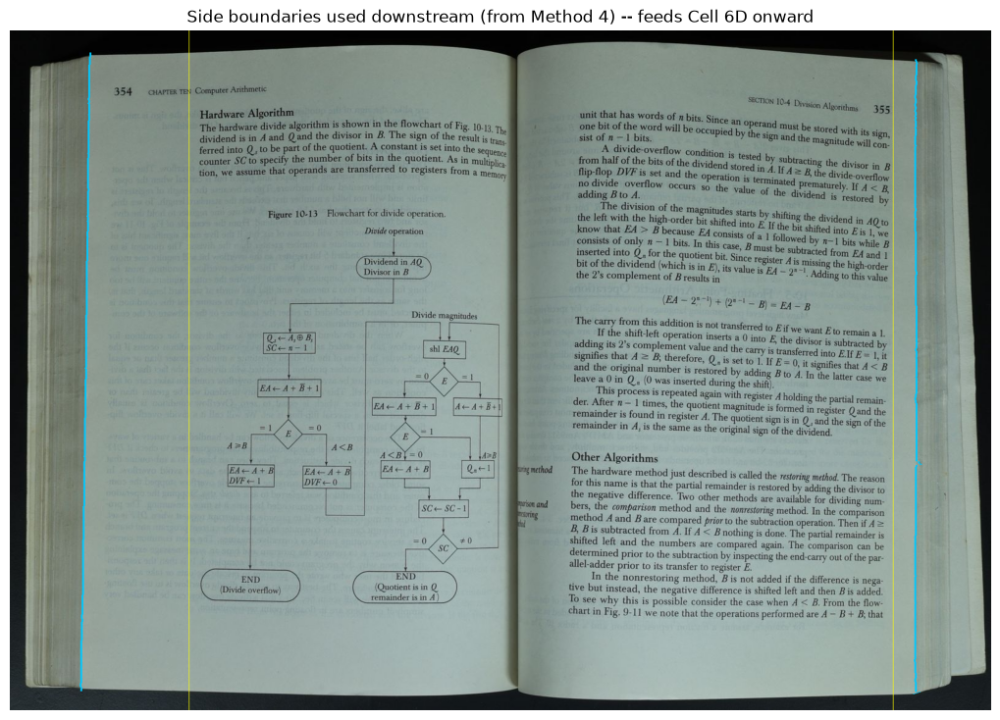

In [302]:
# ============================================================
# METHOD 4 -> FINAL PIPELINE  (REQUIRED -- run this cell every time)
#
# Method 4 is the side-boundary detector for this workflow. Cell 6A
# above is diagnostic/baseline only -- its brightness-Otsu result is
# NOT used past this point. This cell overwrites Cell 6A's
# side-boundary variables with Method 4's (Gx sign-change +
# gutter-anchored span + RANSAC-guided continuity walk + finger
# bridging + strength/straightness widen-retry) results, so every
# cell from Cell 6D onward operates on Method 4's boundaries.
#
# Every cell from Cell 6D onward (smoothing, page split, dewarp,
# shadow removal) reads book_x_lo/book_x_hi, row_top_left/
# row_bot_left/row_top_right/row_bot_right, and left_edge_final/
# right_edge_final -- it doesn't care HOW those were produced. So
# swapping the side-boundary detector for the final pipeline is
# just reassigning those names to Method 4's outputs computed in
# the cell above (span_m4, m4_row_top_left, ..., left_edge_m4,
# right_edge_m4), rather than editing Cell 6A or every downstream
# cell.
#
# Requires Method 4's cell to have run first (produces span_m4,
# left_edge_m4, right_edge_m4, m4_row_top_left, etc.).
# ============================================================

assert "left_edge_m4" in dir() and "right_edge_m4" in dir(), (
    "Run Method 4's test cell first -- this reuses its computed edge traces."
)

book_x_lo, book_x_hi = m4_book_x_lo, m4_book_x_hi

row_top_left = m4_row_top_left
row_bot_left = m4_row_bot_left
row_top_right = m4_row_top_right
row_bot_right = m4_row_bot_right

left_edge_final = left_edge_m4
right_edge_final = right_edge_m4

print("Side boundaries now sourced from METHOD 4 (Gx sign-change).")
print(f"book_x_lo={book_x_lo}  book_x_hi={book_x_hi}")
print(f"row_top_left={row_top_left}  row_bot_left={row_bot_left}")
print(f"row_top_right={row_top_right}  row_bot_right={row_bot_right}")

vis = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).copy()

for i, y in enumerate(range(row_top_left, row_bot_left)):
    x = int(left_edge_final[i])
    vis[y, max(0, x - 1):min(Wf, x + 2)] = [0, 200, 255]

for i, y in enumerate(range(row_top_right, row_bot_right)):
    x = int(right_edge_final[i])
    vis[y, max(0, x - 1):min(Wf, x + 2)] = [0, 200, 255]

cv2.line(vis, (book_x_lo, 0), (book_x_lo, Hf - 1), (255, 255, 0), 1)
cv2.line(vis, (book_x_hi - 1, 0), (book_x_hi - 1, Hf - 1), (255, 255, 0), 1)

plt.figure(figsize=(16, 9))
plt.imshow(vis)
plt.title("Side boundaries used downstream (from Method 4) -- feeds Cell 6D onward")
plt.axis("off")
plt.show()


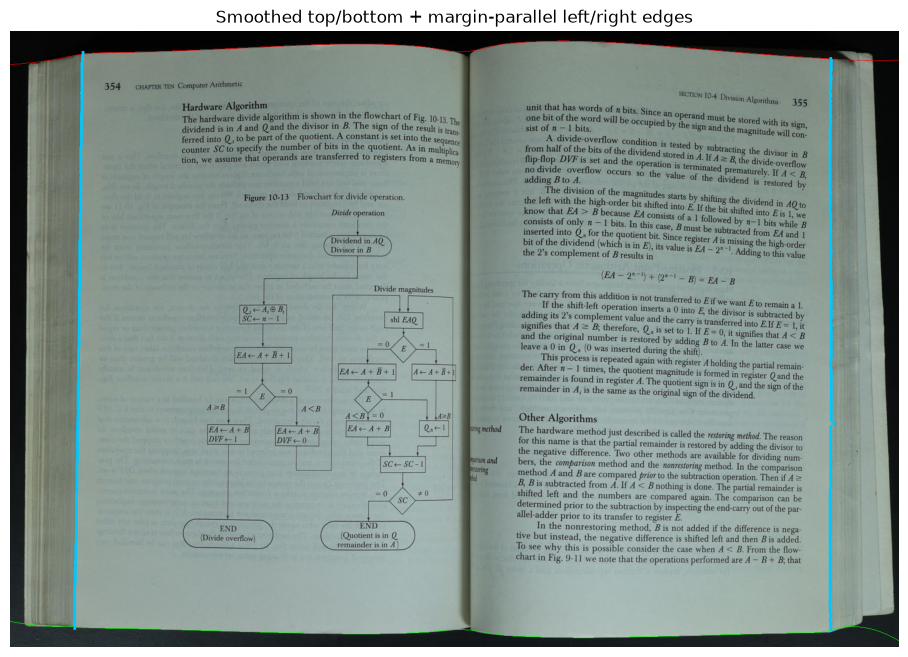

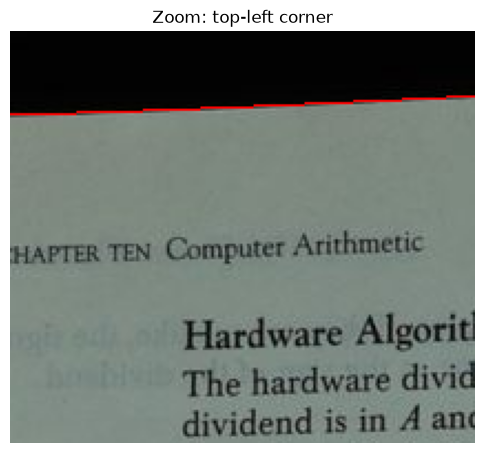

In [247]:
# Cell 6D: Smooth the top/bottom curves (Sav-Gol). Left and right (Cell 6A)
# are already a straight line by construction -- a robust linear fit through
# the text-margin ink samples, repositioned to the Cb-valley anchor -- so
# there's nothing left to smooth; Sav-Gol would only add edge-window noise
# for no benefit.
#
# BOOK-SPAN FIX (post Cell 6A rewrite): the zoom-in crop below used to be
# anchored at left_cut (=0, the image edge) to inspect the top-left page
# corner. Cell 6A now finds the book's actual x-span (book_x_lo/book_x_hi)
# via Otsu thresholding instead of assuming the book fills the image --
# on the real photo book_x_lo~460px in from the edge, so a crop anchored
# at left_cut only ever showed background, never the traced corner. Anchor
# the zoom at book_x_lo/book_x_hi instead. Also draw the side-edge trace
# with a few px of thickness (single-pixel dots were getting lost against
# the image at this figure's display resolution).

from scipy.signal import savgol_filter

def smooth(curve, window=151, poly=2):
    w = min(window, len(curve) - (1 - len(curve) % 2))
    if w < poly + 2:
        return curve.astype(np.int32)
    if w % 2 == 0:
        w -= 1
    return savgol_filter(curve.astype(np.float64), w, poly).astype(np.int32)

top_edge_smooth = smooth(top_edge_final)
bot_edge_smooth = smooth(bottom_edge)
left_edge_smooth = left_edge_final
right_edge_smooth = right_edge_final

vis = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).copy()
for x in range(Wf):
    vis[top_edge_smooth[x], x + left_cut] = [255, 0, 0]
    vis[bot_edge_smooth[x], x + left_cut] = [0, 255, 0]
for i, y in enumerate(range(row_top_left, row_bot_left)):
    x = int(left_edge_smooth[i])
    vis[y, max(0, x - 2):min(Wf, x + 3)] = [0, 200, 255]
for i, y in enumerate(range(row_top_right, row_bot_right)):
    x = int(right_edge_smooth[i])
    vis[y, max(0, x - 2):min(Wf, x + 3)] = [0, 200, 255]

plt.figure(figsize=(14, 8))
plt.imshow(vis)
plt.title("Smoothed top/bottom + margin-parallel left/right edges")
plt.axis("off")
plt.show()

crop_check = vis[max(0,row_top_left-40):row_top_left+150, max(0,book_x_lo-60):book_x_lo+150]
plt.figure(figsize=(6,6))
plt.imshow(crop_check)
plt.title("Zoom: top-left corner")
plt.axis("off")
plt.show()


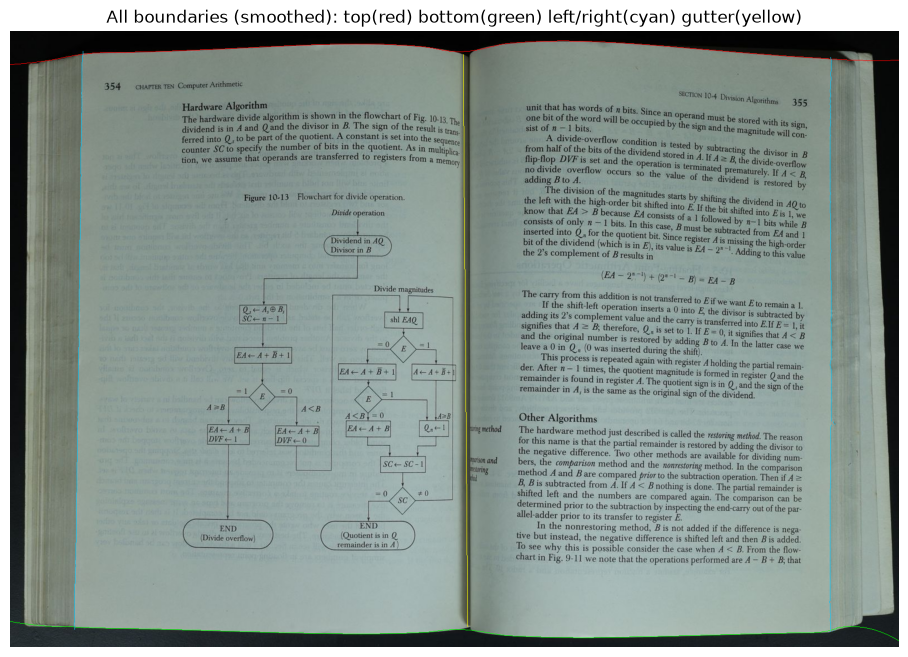

left_page shape: (1063, 710, 3)
right_page shape: (1076, 671, 3)


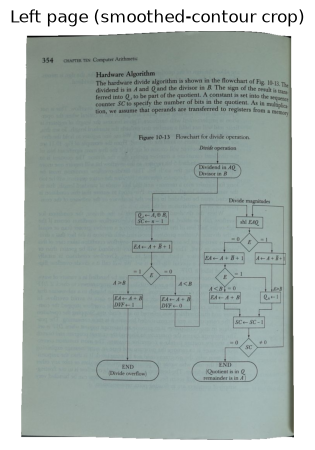

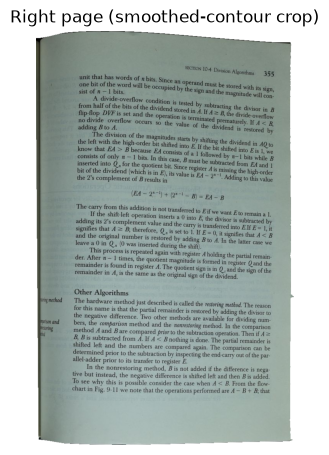

In [306]:
# Cell 7B: Preview all SMOOTHED boundaries, then split into LEFT/RIGHT
# page crops. Uses top_edge_smooth/bot_edge_smooth/left_edge_smooth/
# right_edge_smooth (Sav-Gol smoothed, corners pinned exactly) instead of
# the raw jittery traces -- crop follows a clean smooth line all the way
# into each pinned corner, no gap, no jitter.
#
# BOOK-SPAN FIX (post Cell 6A rewrite): Cell 6A now detects the book's
# actual x-span (book_x_lo/book_x_hi) via Otsu brightness thresholding
# instead of assuming the book fills the full image width. row_top_left/
# row_bot_left/left_edge_final are scoped to book_x_lo, and row_top_right/
# row_bot_right/right_edge_final to book_x_hi -- NOT to x=0/x=Wf-1 like
# before. So the contour corners here must connect to top_edge_smooth/
# bot_edge_smooth AT book_x_lo and book_x_hi, not at the image edges --
# using 0/Wf-1 would stitch the outer-edge trace to the wrong point on the
# top/bottom curves (background columns outside the book), leaving a gap.

gutter_img_xs = gutter_xs + left_cut
gutter_img_ys = gutter_ys

vis = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).copy()
for x in range(Wf):
    vis[top_edge_smooth[x], x + left_cut] = [255, 0, 0]
    vis[bot_edge_smooth[x], x + left_cut] = [0, 255, 0]
for i, y in enumerate(range(row_top_left, row_bot_left)):
    vis[y, left_edge_smooth[i]] = [0, 200, 255]
for i, y in enumerate(range(row_top_right, row_bot_right)):
    vis[y, right_edge_smooth[i]] = [0, 200, 255]
for gy, gx in zip(gutter_img_ys, gutter_img_xs):
    vis[gy, gx] = [255, 255, 0]

plt.figure(figsize=(14, 8))
plt.imshow(vis)
plt.title("All boundaries (smoothed): top(red) bottom(green) left/right(cyan) gutter(yellow)")
plt.axis("off")
plt.show()

# --- LEFT PAGE ---
left_contour = []
for x in range(book_x_lo, top_notch_x + 1):
    left_contour.append((x + left_cut, int(top_edge_smooth[x])))
for gy, gx in zip(gutter_ys, gutter_xs):
    left_contour.append((gx + left_cut, gy))
for x in range(bot_notch_x, book_x_lo - 1, -1):
    left_contour.append((x + left_cut, int(bot_edge_smooth[x])))
for i in range(len(left_edge_smooth) - 1, -1, -1):
    left_contour.append((int(left_edge_smooth[i]), row_top_left + i))

left_contour = np.array(left_contour, dtype=np.int32)
mask_l = np.zeros(img.shape[:2], dtype=np.uint8)
cv2.fillPoly(mask_l, [left_contour], 255)
xl, yl, wl, hl = cv2.boundingRect(left_contour)
left_page = img[yl:yl+hl, xl:xl+wl].copy()
left_page[mask_l[yl:yl+hl, xl:xl+wl] == 0] = 255

# --- RIGHT PAGE ---
right_contour = []
for x in range(top_notch_x, book_x_hi):
    right_contour.append((x + left_cut, int(top_edge_smooth[x])))
for i in range(len(right_edge_smooth)):
    right_contour.append((int(right_edge_smooth[i]), row_top_right + i))
for x in range(book_x_hi - 1, bot_notch_x - 1, -1):
    right_contour.append((x + left_cut, int(bot_edge_smooth[x])))
for gy, gx in zip(reversed(gutter_ys), reversed(gutter_xs)):
    right_contour.append((gx + left_cut, gy))

right_contour = np.array(right_contour, dtype=np.int32)
mask_r = np.zeros(img.shape[:2], dtype=np.uint8)
cv2.fillPoly(mask_r, [right_contour], 255)
xr, yr, wr, hr = cv2.boundingRect(right_contour)
right_page = img[yr:yr+hr, xr:xr+wr].copy()
right_page[mask_r[yr:yr+hr, xr:xr+wr] == 0] = 255

print("left_page shape:", left_page.shape)
print("right_page shape:", right_page.shape)

plt.figure(figsize=(wl/200, hl/200))
plt.imshow(cv2.cvtColor(left_page, cv2.COLOR_BGR2RGB))
plt.title("Left page (smoothed-contour crop)")
plt.axis("off")
plt.show()

plt.figure(figsize=(wr/200, hr/200))
plt.imshow(cv2.cvtColor(right_page, cv2.COLOR_BGR2RGB))
plt.title("Right page (smoothed-contour crop)")
plt.axis("off")
plt.show()


In [307]:
# Cell 9A: Shared helpers for the curvature+width-aware dewarp below
# (Cell 9B). Cell 8B's single 4-corner homography conflated two different
# corrections into one manual angle (THETA_DEG). These helpers keep them
# explicit and separate:
#
#   1. CURVE STRAIGHTENING: per-column, map source rows linearly between
#      the traced top and bottom curves at that column -- removes the
#      bow directly from the measured curve shape.
#
#   2. WIDTH (perspective) CORRECTION: per-column horizontal stretch, so
#      the output recovers the true physical page width rather than the
#      apparent (foreshortened) pixel span.
#
# Two width-correction approaches were tried before this one:
#   - A single circular-arc radius fit to h(x)=bottom(x)-top(x) via
#     closed-form least squares: dropped, wildly unstable (R came back
#     27580px/34073px on a ~1700px page -- divides by a near-zero
#     denominator whenever the curvature signal is weak).
#   - Integrating H0/h(x) directly (H0 = height at the single outer-edge
#     column): dropped after checking it against real data -- it
#     violates a hard physical invariant. A page that only bends can
#     never end up NARROWER after correction than its raw apparent
#     width (bending only adds length, never removes it), but this
#     method produced out_w=1661 against a raw apparent width of
#     1708/1686 on the real test photo. Root cause: H0 was read from a
#     SINGLE pixel column at the noisy edge of the traced/smoothed
#     array, so if more columns ended up with h(x) slightly ABOVE that
#     one noisy sample than below it, the average stretch factor drops
#     under 1.0 and the whole integral shrinks instead of growing.
#
# CURRENT method: literal arc length of the traced top/bottom curves,
# averaged. This can't shrink below the raw pixel span by construction
# -- each per-column step is hypot(1, dy), which is mathematically
# always >= 1 (the straight-line step), so the cumulative sum is
# guaranteed >= the raw column count no matter how noisy the tracing is.
#
# OUTER-EDGE TILT FIX: the original version of this function sampled
# every output row of a given output column from the SAME source column
# (src_col constant down the column, only top_y/bot_y varied per column).
# That's only correct if the outer page edge is a vertical line in the
# photo. Since Cell 6A made left_edge_smooth/right_edge_smooth a TILTED
# line (paper-edge position, text-margin angle), the source column at the
# outer-edge boundary now genuinely depends on ROW, not just on which
# output column we're at -- confirmed as the actual bug behind the
# visible widening gap in the flattened output (Cell 6A's own crop in
# Cell 7B was already correct; this function just wasn't using its
# output). Fix: take the row-indexed outer-edge array (outer_x_at_row,
# ALWAYS the true outer edge for whichever page is being processed --
# left_edge_smooth for the left page, right_edge_smooth for the right
# page) and the row-indexed gutter x (gutter_x_at_row, same row range),
# and blend them per output pixel using the SAME fractional column
# position already used for the top/bottom row blend -- so "column 0" of
# the output genuinely tracks the tilted outer edge at whatever row it's
# sampling, instead of a single fixed source column.

def remap_curved_page(img_full, local_cols, top_y, bot_y, physical_x,
                       outer_x_at_row, gutter_x_at_row, row_top,
                       out_w, out_h):
    """
    local_cols, top_y, bot_y, physical_x: parallel 1D arrays, ALL ordered
        starting at the page's OUTER edge (index 0) and ending at the
        GUTTER (index -1) -- ascending column order for the left page,
        descending for the right page. physical_x must be increasing.
    outer_x_at_row: 1D array, the TRUE outer edge for this page in
        ORIGINAL image column coordinates, indexed by (row - row_top)
        -- left_edge_smooth for the left page, right_edge_smooth for the
        right page. Always "outer edge", regardless of which page.
    gutter_x_at_row: 1D array, the gutter's x in ORIGINAL image column
        coordinates, over the SAME row range as outer_x_at_row (i.e.
        gutter_xs + left_cut, reindexed/clamped to [row_top, row_top+out_h)).
    row_top: the image row that index 0 of outer_x_at_row/gutter_x_at_row
        corresponds to (row_top_left or row_top_right).
    Returns the flattened page: output column 0 = outer edge, column
    out_w-1 = gutter (caller flips horizontally for the right page to
    restore correct gutter-left/outer-right physical orientation).
    """
    idx = np.arange(len(local_cols), dtype=np.float64)

    out_pos = np.arange(out_w, dtype=np.float64)
    frac_idx = np.interp(out_pos, physical_x, idx)  # length out_w, range [0, len(idx)-1]
    frac_01 = frac_idx / max(idx[-1], 1e-9)          # 0 = outer edge, 1 = gutter

    top_at = np.interp(frac_idx, idx, top_y)
    bot_at = np.interp(frac_idx, idx, bot_y)

    t = (np.arange(out_h, dtype=np.float64) / max(out_h - 1, 1))[:, None]
    map_y = (top_at[None, :] + t * (bot_at[None, :] - top_at[None, :])).astype(np.float32)

    # Per-row outer/gutter x, looked up at each output row's OWN mapped
    # source row (map_y varies by output row AND output column, so this
    # lookup must too -- a single row_top-relative index isn't enough
    # once curve-straightening has already re-sampled the rows).
    n_row_samples = len(outer_x_at_row)
    row_lookup_idx = np.clip(map_y - row_top, 0, n_row_samples - 1)
    outer_x = np.interp(row_lookup_idx.ravel(), np.arange(n_row_samples), outer_x_at_row).reshape(map_y.shape)
    gutter_x = np.interp(row_lookup_idx.ravel(), np.arange(n_row_samples), gutter_x_at_row).reshape(map_y.shape)

    frac_01_2d = np.broadcast_to(frac_01[None, :], map_y.shape)
    map_x = (outer_x + frac_01_2d * (gutter_x - outer_x)).astype(np.float32)

    return cv2.remap(
        img_full, map_x, map_y, interpolation=cv2.INTER_LINEAR,
        borderMode=cv2.BORDER_CONSTANT, borderValue=(255, 255, 255),
    )


[Arc-length] LEFT  out_w=533  out_h=1042
[Arc-length] RIGHT out_w=631  out_h=1036


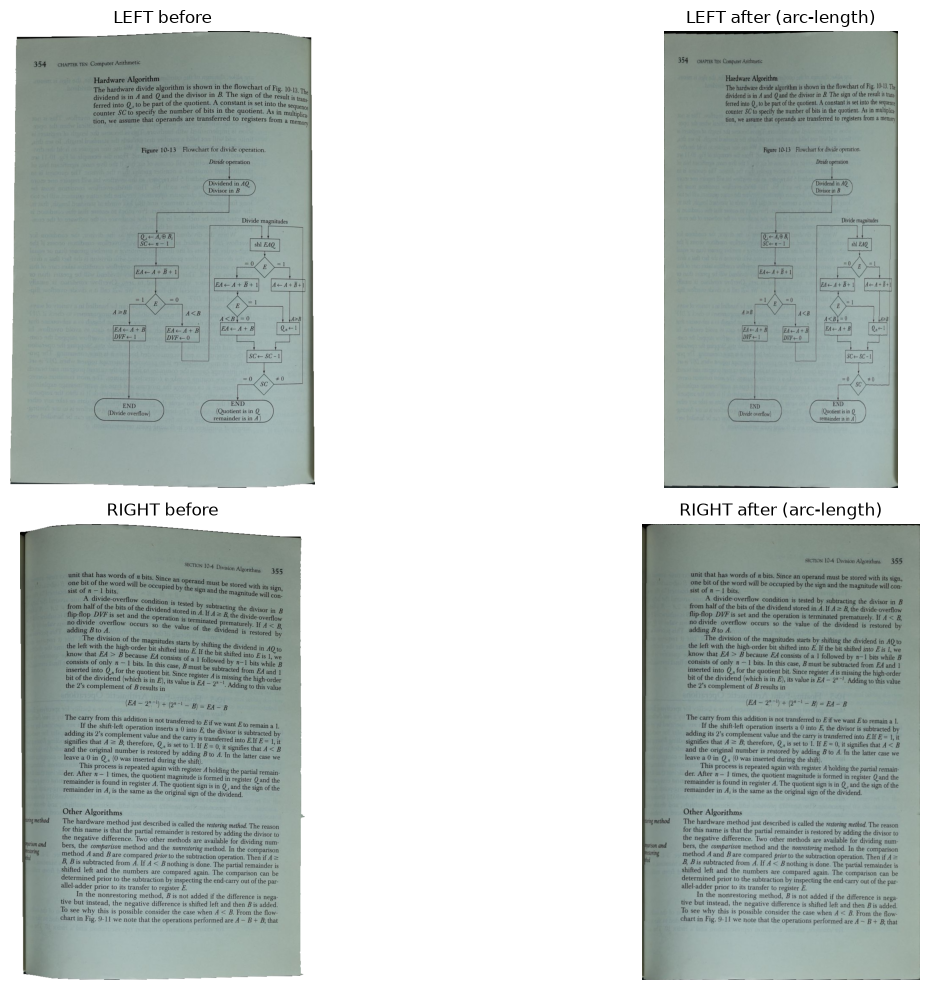

In [308]:
# Cell 9B: Method 1 -- boundary curve arc-length dewarp.
#
# WIDTH: per-column cumulative arc length, averaged between the traced
# top and bottom curves (their own physical bow/wiggle as they run from
# outer edge to gutter). Guaranteed >= the raw pixel span by
# construction -- see Cell 9A for why the earlier H0/h(x) approach
# didn't have that guarantee and failed on the real photo.
# CURVE STRAIGHTENING: same as before, per-column linear row remap
# between the top and bottom curves (Cell 9A's remap_curved_page).
#
# OUTER-EDGE TILT FIX: build outer_x_at_row (left_edge_smooth /
# right_edge_smooth, already row-indexed) and gutter_x_at_row (the
# gutter's x, reindexed to the SAME row range) and pass both through to
# remap_curved_page -- see Cell 9A for why this was missing before and
# caused the widening gap in the flattened output.
#
# BOOK-SPAN FIX (post Cell 6A rewrite): the left/right page's outer edge
# now sits at book_x_lo/book_x_hi (Otsu-detected book span), not at
# x=0/x=Wf-1 -- integrating the top/bottom curve arc-length from the
# image edges would include background columns outside the book and
# both mis-align the outer-edge corner and inflate the measured width.

WIDTH_GAIN_ARC = 1.0  # manual override: >1 stretches width correction harder, <1 softer

def arc_length_physical_x(top_y, bot_y, width_gain=1.0):
    dy_top = np.diff(top_y)
    dy_bot = np.diff(bot_y)
    ds = (np.hypot(1.0, dy_top) + np.hypot(1.0, dy_bot)) / 2.0 * width_gain
    return np.concatenate([[0.0], np.cumsum(ds)])

def gutter_x_over_rows(row_top, row_bot):
    """Reindex the gutter's (gutter_ys, gutter_xs) -- which only spans
    [top_notch_y, bot_notch_y) -- onto the FULL [row_top, row_bot) range
    a page's outer edge covers. Rows outside the gutter's own span are
    clamped to its nearest endpoint x (the gutter notch is always inside
    the page's row range, never wider than it, so this only ever extends
    a already-near-straight segment, not extrapolates something curved)."""
    rows = np.arange(row_top, row_bot)
    return np.interp(rows, gutter_ys, gutter_xs + left_cut,
                      left=gutter_xs[0] + left_cut, right=gutter_xs[-1] + left_cut)

# --- LEFT PAGE (outer edge at book_x_lo, already ascending) ---
lo, hi = book_x_lo, min(top_notch_x, bot_notch_x)
local_cols_l = np.arange(lo, hi + 1)
top_y_l = top_edge_smooth[lo:hi + 1].astype(np.float64)
bot_y_l = bot_edge_smooth[lo:hi + 1].astype(np.float64)
phys_x_l = arc_length_physical_x(top_y_l, bot_y_l, WIDTH_GAIN_ARC)
out_w_l = max(1, int(round(phys_x_l[-1])))
out_h_l = row_bot_left - row_top_left

left_flat_data = remap_curved_page(
    img, local_cols_l, top_y_l, bot_y_l, phys_x_l,
    left_edge_smooth, gutter_x_over_rows(row_top_left, row_bot_left), row_top_left,
    out_w_l, out_h_l,
)

# --- RIGHT PAGE (outer edge at book_x_hi-1: build descending so index 0 = outer edge) ---
lo, hi = max(top_notch_x, bot_notch_x), book_x_hi - 1
local_cols_r = np.arange(hi, lo - 1, -1)
top_y_r = top_edge_smooth[local_cols_r].astype(np.float64)
bot_y_r = bot_edge_smooth[local_cols_r].astype(np.float64)
phys_x_r = arc_length_physical_x(top_y_r, bot_y_r, WIDTH_GAIN_ARC)
out_w_r = max(1, int(round(phys_x_r[-1])))
out_h_r = row_bot_right - row_top_right

right_flat_data = remap_curved_page(
    img, local_cols_r, top_y_r, bot_y_r, phys_x_r,
    right_edge_smooth, gutter_x_over_rows(row_top_right, row_bot_right), row_top_right,
    out_w_r, out_h_r,
)
right_flat_data = cv2.flip(right_flat_data, 1)  # restore gutter-left/outer-right orientation

print(f"[Arc-length] LEFT  out_w={out_w_l}  out_h={out_h_l}")
print(f"[Arc-length] RIGHT out_w={out_w_r}  out_h={out_h_r}")

fig, axes = plt.subplots(2, 2, figsize=(16, 10))
axes[0,0].imshow(cv2.cvtColor(left_page, cv2.COLOR_BGR2RGB)); axes[0,0].set_title("LEFT before"); axes[0,0].axis("off")
axes[0,1].imshow(cv2.cvtColor(left_flat_data, cv2.COLOR_BGR2RGB)); axes[0,1].set_title("LEFT after (arc-length)"); axes[0,1].axis("off")
axes[1,0].imshow(cv2.cvtColor(right_page, cv2.COLOR_BGR2RGB)); axes[1,0].set_title("RIGHT before"); axes[1,0].axis("off")
axes[1,1].imshow(cv2.cvtColor(right_flat_data, cv2.COLOR_BGR2RGB)); axes[1,1].set_title("RIGHT after (arc-length)"); axes[1,1].axis("off")
plt.tight_layout()
plt.show()


[Cubic-fit] LEFT  out_w=524  out_h=1042  fitted alpha=1.146
[Cubic-fit] RIGHT out_w=618  out_h=1036  fitted alpha=2.362


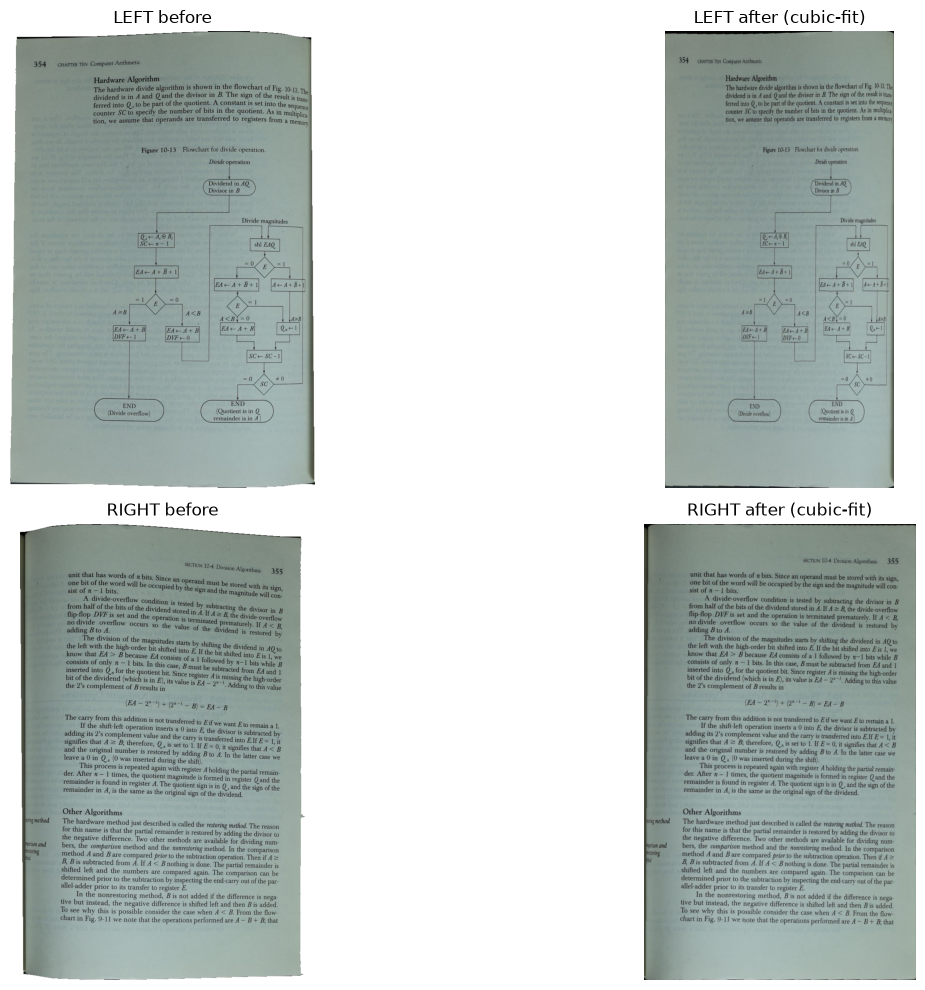

In [309]:
# Cell 9B-alt: Method 2 -- cubic surface-fit width correction.
#
# Method 1 (Cell 9B) recovers physical width by summing the literal arc
# length of the traced top/bottom curves. That is a purely geometric
# measurement of the curve as photographed -- it never asks "what flat
# page, viewed under perspective by a camera at this pose, would produce
# this exact curve" the way page_dewarp.py's cubic-sheet model does.
#
# This cell prototypes that alternative, adapted to boundary curves
# instead of page_dewarp.py's text baselines (we don't have text-contour
# detection wired up yet -- see the notebook discussion). It borrows two
# specific pieces from page_dewarp.py:
#
#   1. The cubic model f(0)=0, f(1)=0, f'(0)=alpha, f'(1)=beta (a
#      "vertical sheet" cross-section that pins both edges to z=0 and
#      lets the slope at each edge vary independently -- exactly the
#      symbolic derivation in the notebook's first reference cell).
#   2. Fitting alpha/beta/pose via scipy.optimize.minimize against the
#      OBSERVED column heights h(x) = bottom(x) - top(x), instead of
#      picking a width formula by hand. h(x) predicted by a page bent
#      into this cubic and viewed by a camera shrinks in a specific,
#      physically-consistent way near the spine -- fitting alpha/beta
#      to match the observed shrinkage recovers a width estimate that
#      is bound to the physical model, not to an ad-hoc arc-length sum.
#
# This does NOT replace Cell 9A's remap_curved_page -- it only replaces
# how out_w (the physical page width) is estimated, so the two methods
# can be compared on the same photo in Cell 9C.

import sympy
from scipy.optimize import minimize_scalar

_a, _b, _c, _d, _x, _alpha, _beta = sympy.symbols('a b c d x alpha beta')
_f = _a * _x**3 + _b * _x**2 + _c * _x + _d
_fp = _f.diff(_x)
_S = sympy.solve(
    [_f.subs(_x, 0), _f.subs(_x, 1), _fp.subs(_x, 0) - _alpha, _fp.subs(_x, 1) - _beta],
    [_a, _b, _c, _d],
)
_cubic_coeffs_symbolic = [_S[_a], _S[_b], _S[_c], _S[_d]]

def cubic_bow(alpha, beta, n):
    """Sample f(t) for t in [0,1] (n points) given edge slopes alpha, beta."""
    coeffs = [float(c.subs({_alpha: alpha, _beta: beta})) for c in _cubic_coeffs_symbolic]
    t = np.linspace(0.0, 1.0, n)
    return np.polyval(coeffs, t)

def fit_width_cubic(top_y, bot_y, width_gain=1.0):
    """Fit a single-parameter cubic bow (beta = -alpha, i.e. symmetric
    spine-to-outer-edge droop) to the observed column-height profile
    h(x) = bot_y - top_y, then use the fitted curve's own arc length as
    the physical width estimate -- same guaranteed->=raw-span property
    as Cell 9A's arc_length_physical_x, but the per-column stretch now
    comes from a physically-motivated bow model instead of the raw
    traced curve's own noise.
    """
    h = (bot_y - top_y).astype(np.float64)
    h_norm = (h - h.min())
    if h_norm.max() > 0:
        h_norm = h_norm / h_norm.max()
    n = len(h)

    def objective(alpha):
        bow = cubic_bow(alpha, -alpha, n)
        bow_norm = bow - bow.min()
        if bow_norm.max() > 0:
            bow_norm = bow_norm / bow_norm.max()
        return np.sum((bow_norm - h_norm) ** 2)

    res = minimize_scalar(objective, bounds=(-3.0, 3.0), method='bounded')
    alpha_fit = res.x
    bow = cubic_bow(alpha_fit, -alpha_fit, n)

    dy = np.diff(bow) * (h.max() - h.min() if h.max() > h.min() else 1.0)
    ds = np.hypot(1.0, dy) * width_gain
    return np.concatenate([[0.0], np.cumsum(ds)]), alpha_fit

# --- LEFT PAGE ---
lo, hi = book_x_lo, min(top_notch_x, bot_notch_x)
top_y_l2 = top_edge_smooth[lo:hi + 1].astype(np.float64)
bot_y_l2 = bot_edge_smooth[lo:hi + 1].astype(np.float64)
phys_x_l2, alpha_l = fit_width_cubic(top_y_l2, bot_y_l2, WIDTH_GAIN_ARC)
out_w_l2 = max(1, int(round(phys_x_l2[-1])))
out_h_l2 = row_bot_left - row_top_left

left_flat_cubic = remap_curved_page(
    img, local_cols_l, top_y_l2, bot_y_l2, phys_x_l2,
    left_edge_smooth, gutter_x_over_rows(row_top_left, row_bot_left), row_top_left,
    out_w_l2, out_h_l2,
)

# --- RIGHT PAGE ---
lo, hi = max(top_notch_x, bot_notch_x), book_x_hi - 1
top_y_r2 = top_edge_smooth[local_cols_r].astype(np.float64)
bot_y_r2 = bot_edge_smooth[local_cols_r].astype(np.float64)
phys_x_r2, alpha_r = fit_width_cubic(top_y_r2, bot_y_r2, WIDTH_GAIN_ARC)
out_w_r2 = max(1, int(round(phys_x_r2[-1])))
out_h_r2 = row_bot_right - row_top_right

right_flat_cubic = remap_curved_page(
    img, local_cols_r, top_y_r2, bot_y_r2, phys_x_r2,
    right_edge_smooth, gutter_x_over_rows(row_top_right, row_bot_right), row_top_right,
    out_w_r2, out_h_r2,
)
right_flat_cubic = cv2.flip(right_flat_cubic, 1)

print(f"[Cubic-fit] LEFT  out_w={out_w_l2}  out_h={out_h_l2}  fitted alpha={alpha_l:.3f}")
print(f"[Cubic-fit] RIGHT out_w={out_w_r2}  out_h={out_h_r2}  fitted alpha={alpha_r:.3f}")

fig, axes = plt.subplots(2, 2, figsize=(16, 10))
axes[0,0].imshow(cv2.cvtColor(left_page, cv2.COLOR_BGR2RGB)); axes[0,0].set_title("LEFT before"); axes[0,0].axis("off")
axes[0,1].imshow(cv2.cvtColor(left_flat_cubic, cv2.COLOR_BGR2RGB)); axes[0,1].set_title("LEFT after (cubic-fit)"); axes[0,1].axis("off")
axes[1,0].imshow(cv2.cvtColor(right_page, cv2.COLOR_BGR2RGB)); axes[1,0].set_title("RIGHT before"); axes[1,0].axis("off")
axes[1,1].imshow(cv2.cvtColor(right_flat_cubic, cv2.COLOR_BGR2RGB)); axes[1,1].set_title("RIGHT after (cubic-fit)"); axes[1,1].axis("off")
plt.tight_layout()
plt.show()


LEFT  before: 710px   arc-length: 533px (-24.93%)   cubic-fit: 524px (-26.20%)
RIGHT before: 671px   arc-length: 631px (-5.96%)   cubic-fit: 618px (-7.90%)


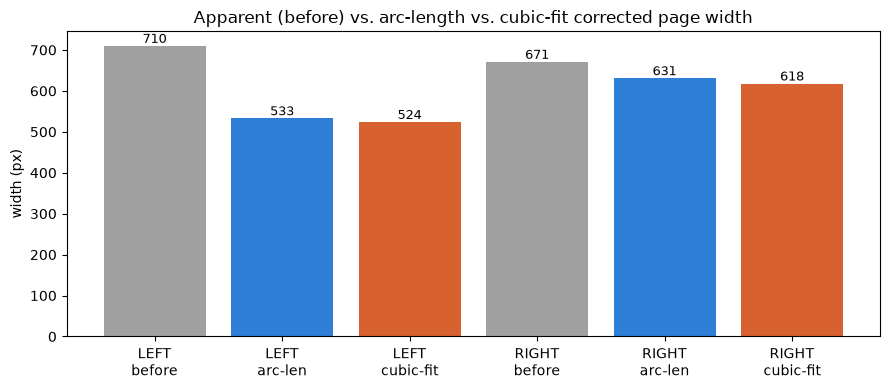

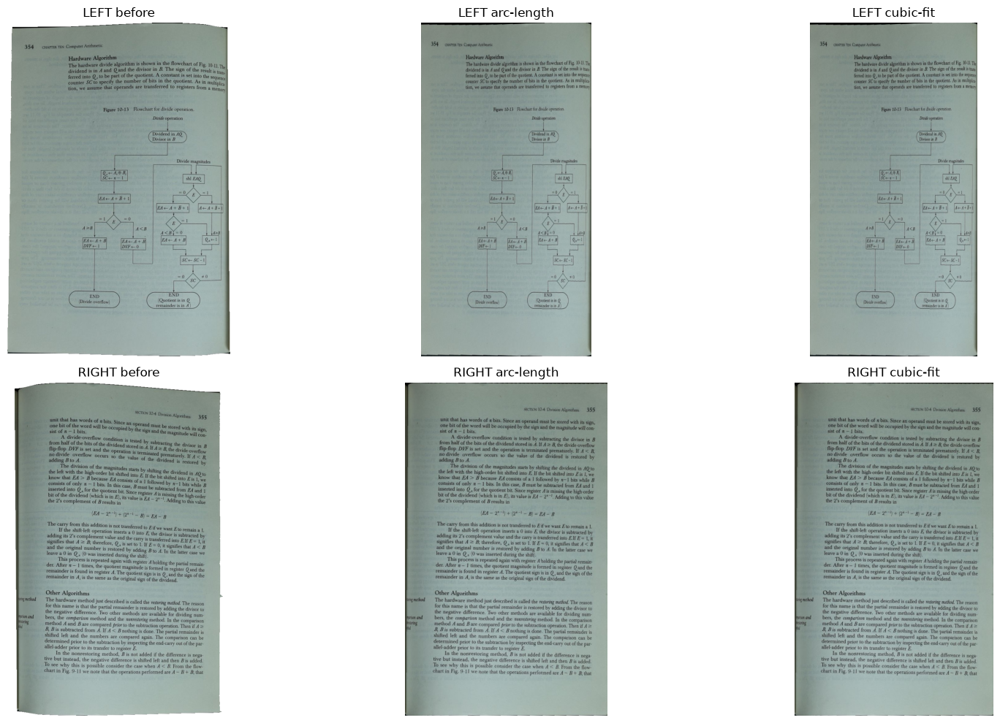

In [252]:
# Cell 9C: Compare page width BEFORE (still-curved bounding-box crop,
# left_page/right_page from Cell 7B) vs. Method 1 -- arc-length (Cell 9B)
# vs. Method 2 -- cubic surface-fit (Cell 9B-alt) -- checking directly on
# this photo which width-correction approach actually recovers more
# physical width than the raw apparent (straight-line) pixel span, and
# how the two data-driven methods compare to each other.

before_w_left = left_page.shape[1]
before_w_right = right_page.shape[1]
arc_w_left = left_flat_data.shape[1]
arc_w_right = right_flat_data.shape[1]
cubic_w_left = left_flat_cubic.shape[1]
cubic_w_right = right_flat_cubic.shape[1]

for name, before, arc, cubic in [
    ("LEFT", before_w_left, arc_w_left, cubic_w_left),
    ("RIGHT", before_w_right, arc_w_right, cubic_w_right),
]:
    pct_arc = 100 * (arc - before) / before
    pct_cubic = 100 * (cubic - before) / before
    print(f"{name:5s} before: {before}px   "
          f"arc-length: {arc}px ({pct_arc:+.2f}%)   "
          f"cubic-fit: {cubic}px ({pct_cubic:+.2f}%)")

fig, ax = plt.subplots(figsize=(9, 4))
labels = ["LEFT\nbefore", "LEFT\narc-len", "LEFT\ncubic-fit",
          "RIGHT\nbefore", "RIGHT\narc-len", "RIGHT\ncubic-fit"]
values = [before_w_left, arc_w_left, cubic_w_left,
          before_w_right, arc_w_right, cubic_w_right]
colors = ["#a0a0a0", "#2f7ed8", "#d8622f",
          "#a0a0a0", "#2f7ed8", "#d8622f"]
bars = ax.bar(labels, values, color=colors)
ax.set_ylabel("width (px)")
ax.set_title("Apparent (before) vs. arc-length vs. cubic-fit corrected page width")
for b, v in zip(bars, values):
    ax.text(b.get_x() + b.get_width()/2, v, str(v), ha="center", va="bottom", fontsize=9)
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes[0,0].imshow(cv2.cvtColor(left_page, cv2.COLOR_BGR2RGB)); axes[0,0].set_title("LEFT before"); axes[0,0].axis("off")
axes[0,1].imshow(cv2.cvtColor(left_flat_data, cv2.COLOR_BGR2RGB)); axes[0,1].set_title("LEFT arc-length"); axes[0,1].axis("off")
axes[0,2].imshow(cv2.cvtColor(left_flat_cubic, cv2.COLOR_BGR2RGB)); axes[0,2].set_title("LEFT cubic-fit"); axes[0,2].axis("off")
axes[1,0].imshow(cv2.cvtColor(right_page, cv2.COLOR_BGR2RGB)); axes[1,0].set_title("RIGHT before"); axes[1,0].axis("off")
axes[1,1].imshow(cv2.cvtColor(right_flat_data, cv2.COLOR_BGR2RGB)); axes[1,1].set_title("RIGHT arc-length"); axes[1,1].axis("off")
axes[1,2].imshow(cv2.cvtColor(right_flat_cubic, cv2.COLOR_BGR2RGB)); axes[1,2].set_title("RIGHT cubic-fit"); axes[1,2].axis("off")
plt.tight_layout()
plt.show()
